# load data

In [1]:
import sys
import os

current_dir = os.path.dirname(os.path.abspath(''))
others_path = os.path.join(current_dir, '..', 'gpr')

others_path = os.path.abspath(others_path)
if others_path not in sys.path:
    sys.path.append(others_path)

import numpy as np
import matplotlib.pyplot as plt

import eos
import kernels
import gaussianprocess
import finitedimensionalgp
import sampling as sam
import prepare_ceft as pc
import prepare_pqcd as pp
import anal_helpers as anal
from pqcd.pQCD import pQCD
from constants import get_phi, ns


from pathlib import Path
notebook_dir = Path.cwd()

In [2]:
n_ceft, cs2_ceft, cs2_l, cs2_u = anal.get_ceft_cs2()
cs2_ceft_sigma = pc.CI_to_sigma(cs2_u-cs2_l)
cs2_hat, X_hat, sigma_hat, l_hat, alpha_hat = sam.get_hype_samples()
n_pqcd, cs2_pqcd = pp.get_pqcd(X_hat, size=400)
cs2_pqcd_sigma = np.zeros_like(cs2_pqcd)



indices = np.arange(0, len(n_ceft), 1)
n = np.concatenate((n_ceft[indices], n_pqcd))
cs2 = np.concatenate((cs2_ceft[indices], cs2_pqcd))
cs2_sigma = np.concatenate((cs2_ceft_sigma[indices], cs2_pqcd_sigma))

# gp stuff

In [353]:
kernel = kernels.Kernel('SE', sigma=sigma_hat, l=l_hat)

x_test = np.linspace(n_ceft[0], n_pqcd[-1], 400) # number density in nsat, starting val is ending val of n crust, ending val is default 10 nsat


gp = gaussianprocess.GP(kernel, get_phi(cs2_hat))
gp.fit(n, x_test, cs2, var_f = cs2_sigma, stabilise=True)

cs2_test, sig = gp.posterior(sampling=False)




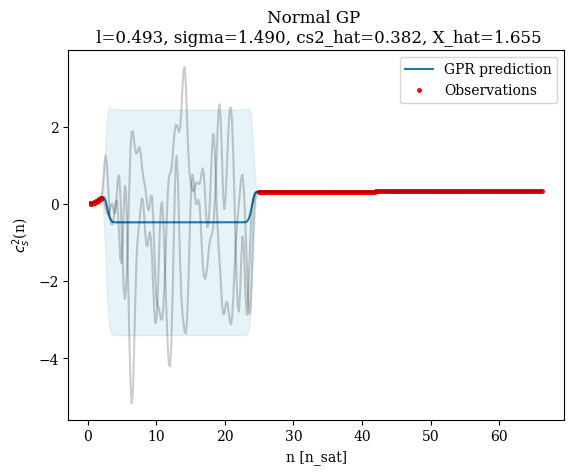

In [354]:
plt.rcParams["font.family"] = "serif"

plt.plot(x_test, cs2_test[0], label=f'GPR prediction')
plt.plot(n, cs2, 'r.', markersize=5, label='Observations')
plt.fill_between(x_test.ravel(), cs2_test[0] - 1.96 * sig, cs2_test[0] + 1.96 * sig, alpha=0.3, color='lightblue')

for i in range(2):
    rng = np.random.default_rng()
    y = rng.multivariate_normal(mean=gp.mean_star, cov=gp.cov_star)
    plt.plot(x_test, y, color="black", alpha=0.2)

plt.xlabel('n [n_sat]')
plt.ylabel(r'$c_s^2$(n)')
plt.title(f"Normal GP \n l={l_hat:.3f}, sigma={sigma_hat:.3f}, cs2_hat={cs2_hat:.3f}, X_hat={X_hat:.3f}")

plt.legend()
plt.show()

In [355]:
m = 500

fdgp = finitedimensionalgp.FDGP(kernel, n, cs2, x_test, cs2_sigma, cs2_hat, True, m=m, sampling=False)
fdgp.fit()

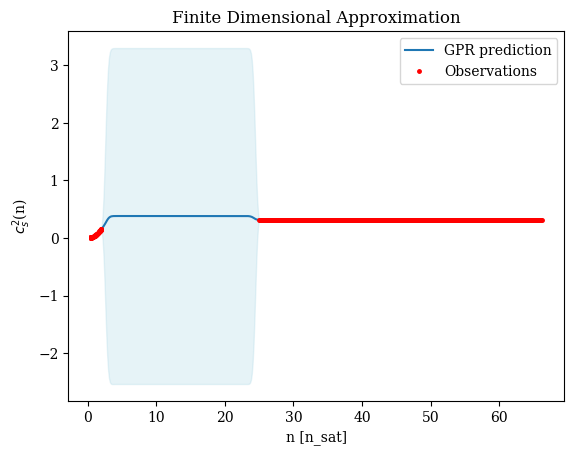

In [356]:
knot_test_fdgp = (fdgp.knots * (fdgp.x_max - fdgp.x_min))+ fdgp.x_min

cs2_test_fdgp = fdgp.mean_star
sig_fdgp = np.sqrt(np.diag(fdgp.cov_star))

plt.rcParams["font.family"] = "serif"

plt.plot(knot_test_fdgp, cs2_test_fdgp, label=f'GPR prediction')
plt.plot(n, cs2, 'r.', markersize=5, label='Observations')
plt.fill_between(knot_test_fdgp.ravel(), cs2_test_fdgp - 1.96 * sig_fdgp, cs2_test_fdgp + 1.96 * sig_fdgp, alpha=0.3, color='lightblue')
plt.xlabel('n [n_sat]')
plt.ylabel(r'$c_s^2$(n)')
plt.title(f"l={l_hat:.3f}, sigma={sigma_hat:.3f}, cs2_hat={cs2_hat:.3f}, X_hat={X_hat:.3f}")
plt.title(fr"Finite Dimensional Approximation")

plt.legend()
plt.show()

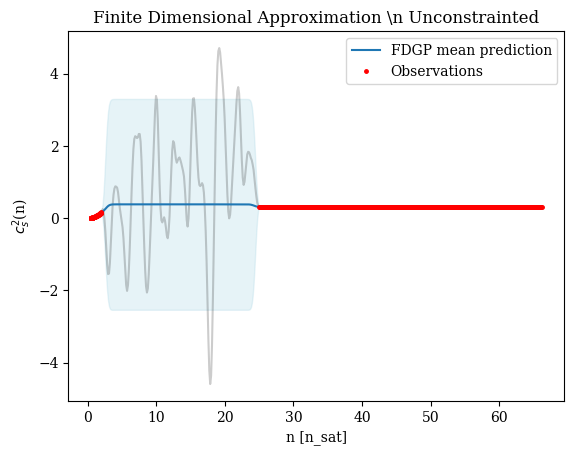

In [357]:
knot_test_fdgp = (fdgp.knots * (fdgp.x_max - fdgp.x_min))+ fdgp.x_min

cs2_test_fdgp = fdgp.mean_star
sig_fdgp = np.sqrt(np.diag(fdgp.cov_star))

plt.rcParams["font.family"] = "serif"

for i in range(1):
    rng = np.random.default_rng()
    y = rng.multivariate_normal(mean=fdgp.mean_star, cov=fdgp.cov_star)
    plt.plot(knot_test_fdgp, y, color="black", alpha=0.2)

plt.plot(knot_test_fdgp, cs2_test_fdgp, label=f'FDGP mean prediction')
plt.plot(n, cs2, 'r.', markersize=5, label='Observations')
plt.fill_between(knot_test_fdgp.ravel(), cs2_test_fdgp - 1.96 * sig_fdgp, cs2_test_fdgp + 1.96 * sig_fdgp, alpha=0.3, color='lightblue')
plt.xlabel('n [n_sat]')
plt.ylabel(r'$c_s^2$(n)')
plt.title(f"l={l_hat:.3f}, sigma={sigma_hat:.3f}, cs2_hat={cs2_hat:.3f}, X_hat={X_hat:.3f}")
plt.title(fr"Finite Dimensional Approximation \n Unconstrainted")

plt.legend()
plt.show()

In [345]:
constr = fdgp.set_constraints(m=fdgp.m, constraint_type='monotonicity', l = 0, u=1, rm_inf=True)

constr_cs2 = fdgp.compute_MAP()

KeyboardInterrupt: 

In [366]:
import cvxpy as cp
from scipy.linalg import cholesky, cho_solve
import proxsuite
import piqp

constr = fdgp.set_constraints(m=fdgp.m, constraint_type='monotonicity', l = 0, u=1, rm_inf=True)

# Cholesky for efficient inverse
L = cholesky(fdgp.cov_star + 1e-8 * np.eye(fdgp.m), lower=True, check_finite=False)
Gamma_inv = cho_solve((L, True), np.eye(fdgp.m), check_finite=False)
r = Gamma_inv @ fdgp.mean_star

Q = Gamma_inv
c = -r
M = fdgp.constraints["M"]
g = fdgp.constraints["g"]



fdgp.cov_star_inverse = Gamma_inv

#### MAIN CELL #####

x = cp.Variable(fdgp.m)
objective = 0.5 * cp.quad_form(x, cp.psd_wrap(Q)) + c @ x
constraints = [M @ x + g >= 0]
#constraints = [Lam_int @ x >= l_int, Lam_int @ x <= u_int]
problem = cp.Problem(cp.Minimize(objective), constraints)

# Solve the QP
problem.solve(solver=cp.PIQP, verbose=True)

# Check status
if problem.status not in ["optimal", "optimal_inaccurate"]:
    raise RuntimeError(f"CVXPY failed: {problem.status}")

# Store the MAP
fdgp.map = x.value

constr_cs2 = fdgp.map

(CVXPY) Jul 03 11:48:56 PM: Your problem has 500 variables, 998 constraints, and 0 parameters.
(CVXPY) Jul 03 11:48:56 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jul 03 11:48:56 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jul 03 11:48:56 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jul 03 11:48:56 PM: Your problem is compiled with the CPP canonicalization backend.
(CVXPY) Jul 03 11:48:56 PM: Compiling problem (target solver=PIQP).
(CVXPY) Jul 03 11:48:56 PM: Reduction chain: CvxAttr2Constr -> Qp2SymbolicQp -> QpMatrixStuffing -> PIQP
(CVXPY) Jul 03 11:48:56 PM: Applying reduction CvxAttr2Constr
(CVXPY) Jul 03 11:48:56 PM: Applying reduction Qp2SymbolicQp
(CVXPY) Jul 03 11:48:56 PM: Applying reduction QpMatrixStuffing
(CVXPY) Jul 03 11:48:56 PM: Applying reduction PIQP
(CVXPY) Jul 03 11:48:56 PM: Finished problem compilation 

                                     CVXPY                                     
                                     v1.6.6                                    
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
-------------------------------------------------------------------------------
                                Numerical solver                               
-------------------------------------------------------------------------------
----------------------------------------------------------
                           PIQP                           
-------------------------------------------------------------------------------
                                    Summary                                    
-------------------------------------------------------------------------------
  

(CVXPY) Jul 03 11:48:57 PM: Problem status: optimal
(CVXPY) Jul 03 11:48:57 PM: Optimal value: -1.587e+09
(CVXPY) Jul 03 11:48:57 PM: Compilation took 1.201e-01 seconds
(CVXPY) Jul 03 11:48:57 PM: Solver (including time spent in interface) took 5.758e-01 seconds


000e-10   1.127e-03   0.9900   0.8427
 11   -1.58744e+09   -1.58744e+09   4.42606e-01   3.17312e-14   1.19470e+02   1.000e-10   1.000e-10   5.243e-04   0.9900   0.7811
 12   -1.58744e+09   -1.58744e+09   1.74243e-01   9.51413e-15   4.20766e+01   1.000e-10   1.000e-10   2.144e-04   0.9900   0.7724
 13   -1.58744e+09   -1.58744e+09   4.15266e-02   5.71977e-15   3.83891e+00   1.000e-10   1.000e-10   4.645e-05   0.9900   0.9303
 14   -1.58744e+09   -1.58744e+09   2.58422e-03   2.52266e-15   3.04574e-01   1.000e-10   1.000e-10   3.205e-06   0.9900   0.9568
 15   -1.58744e+09   -1.58744e+09   1.76907e-04   6.16950e-16   1.88728e-02   1.000e-10   1.000e-10   1.238e-07   0.8580   0.9865

status:               solved
number of iterations: 15
objective:            -1.58744e+09


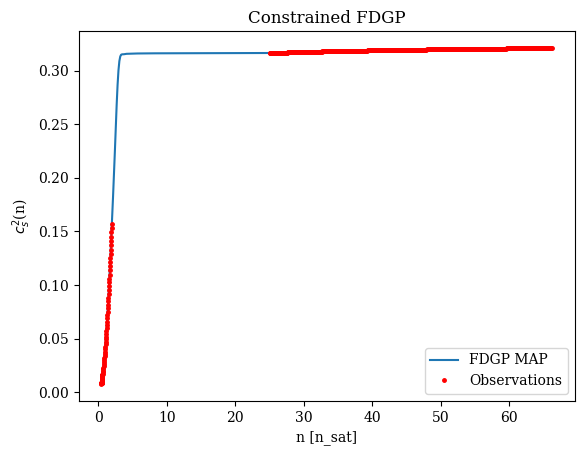

In [367]:
plt.plot(knot_test_fdgp, constr_cs2, label='FDGP MAP')
plt.plot(n, cs2, 'r.', markersize=5, label='Observations')
plt.xlabel('n [n_sat]')
plt.ylabel(r'$c_s^2$(n)')
plt.title("Constrained FDGP")
plt.legend()
plt.show()

In [365]:
samples = fdgp.sample_posterior(5,return_trace=False)

ValueError: Sampling error: ShapeError/OutOfBounds: out of bounds indexing

In [11]:
asdfgasgfan

NameError: name 'asdfgasgfan' is not defined

In [ ]:
fdgp.sample_posterior(100,return_trace=False)

In [ ]:
cs2_constrained = np.asarray([sum(samples[i][j] * fdgp._phi_j(j, fdgp.x_test[:,None]) for j in range(fdgp.m)) for i in range(0,samples.shape[0])])


In [ ]:
x_test_fdgp = (fdgp.x_test * (fdgp.x_max - fdgp.x_min)) + fdgp.x_min


In [ ]:
plt.plot(knot_test_fdgp, constr_cs2, label='FDGP MAP')
for i in range(0, samples.shape[0]):
    plt.plot(x_test_fdgp, cs2_constrained[i], alpha = 0.5)
#plt.plot(n, cs2, 'r.', markersize=5, label='Observations')
plt.xlabel('n [n_sat]')
plt.ylabel(r'$c_s^2$(n)')
plt.title("Constrained FDGP")
plt.legend()
plt.show()

In [ ]:
for i in range(0, samples.shape[0]):
    plt.plot(knot_test_fdgp, constr_cs2, label='FDGP MAP')
    plt.plot(x_test_fdgp, cs2_constrained[i], alpha = 0.5, label='Constrained Sample')
    plt.xlabel('n [n_sat]')
    plt.ylabel(r'$c_s^2$(n)')
    plt.title("Constrained FDGP")
    plt.legend()
    plt.show()
#plt.plot(n, cs2, 'r.', markersize=5, label='Observations')


In [ ]:
fdgp.knots

606 knots in total

when placed uniformly, 

606 knots span about 40 n_s uniformly, so about 15 knots per 1n_s

this means that there are only ~30 knots in chiral eft band

while (40-25)*15 = 225 knots there



so in terms of datapoints, ceft we have 102 datapoints and 30 knots

we have for pqcd, we have 100 points and 225 knots

when pqcd gets wiggly, hmc takes fucking forever

# knots placement

200 obs in pQCD between 25 and 400, that is 13 obs per nsat

175 in ChEFT, that is close to 100 obs per nsat

instead us 80 obs between crust and 2ns

In [3]:
def smooth_spacing(x, delta_low, delta_high, center, width, strength=1):
    """
    Smooth interpolation between delta_low and delta_high centered at 'center',
    with a transition width defined by 'width'.
    """
    sigmoid = 1 / (1 + np.exp(- (x - center) * strength / width))
    return delta_low + (delta_high - delta_low) * sigmoid


In [4]:
def generate_custom_knots_by_count(
    n1, n2, n3,
    transition_width=1.0,
    strength=1,
    region1=(0.47375, 2),
    trans1=(2, 3),
    region2=(3, 24),
    trans2=(24, 25),
    region3=(25, 40)
):
    knots = []

    delta1 = (region1[1] - region1[0]) / (n1 - 1)
    delta2 = (region2[1] - region2[0]) / (n2 - 1)
    delta3 = (region3[1] - region3[0]) / (n3 - 1)

    # region 1:
    x = np.linspace(region1[0], region1[1], n1)
    knots.append(x)

    # transition 1:
    x = [region1[1]]
    while x[-1] < trans1[1]:
        dx = smooth_spacing(x[-1], delta1, delta2, center=np.mean(trans1), width=transition_width, strength=strength)
        next_knot = x[-1] + dx
        x.append(next_knot)
    knots.append(np.array(x[1:]))

    # region 2:
    x = np.linspace(region2[0], region2[1], n2)
    knots.append(x)

    # transition 2:
    x = [region2[1]]
    while x[-1] < trans2[1]:
        dx = smooth_spacing(x[-1], delta2, delta3, center=np.mean(trans2), width=transition_width, strength=strength)
        next_knot = x[-1] + dx
        x.append(next_knot)
    knots.append(np.array(x[:-1]))

    # region 3:
    x = np.linspace(region3[0], region3[1], n3)
    knots.append(x)

    return np.unique(np.concatenate(knots))


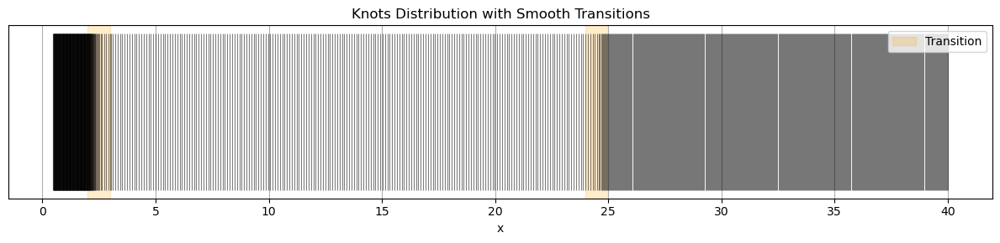

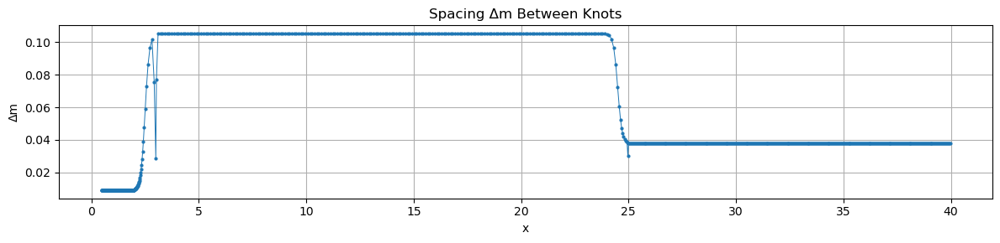

In [5]:
knots = generate_custom_knots_by_count(175,200,400, 
        transition_width=1, 
        strength=10,
        region1=(0.47375, 2),
        trans1=(2, 3),
        region2=(3, 24),
        trans2=(24, 25),
        region3=(25, 40))

spacing = np.diff(knots)

# knots as vertical lines
plt.figure(figsize=(12, 3))
plt.vlines(knots, ymin=0, ymax=1, colors='black', alpha=0.5, linewidth=0.8)
plt.title("Knots Distribution with Smooth Transitions")
plt.xlabel("x")
plt.yticks([])
plt.grid(True)

# highlighting transition regions
for region in [(2, 3), (24, 25)]:
    plt.axvspan(region[0], region[1], color='orange', alpha=0.2, label='Transition' if region == (2, 3) else None)

plt.legend()
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 3))
plt.plot(knots[:-1], spacing, marker='o', markersize=2, linestyle='-', linewidth=0.7)
plt.title("Spacing Δm Between Knots")
plt.xlabel("x")
plt.ylabel("Δm")
plt.grid(True)
plt.tight_layout()
plt.show()


# fdgp with custom knots

In [30]:
knot = generate_custom_knots_by_count(175,100,200, 
        transition_width=1, 
        strength=1000,
        region1=(0.47375, 2),
        trans1=(2, 3),
        region2=(3, 24),
        trans2=(24, 25),
        region3=(25, 50))

kernel = kernels.Kernel('SE', sigma=sigma_hat, l=l_hat)
x_test = np.linspace(n_ceft[0], n_pqcd[-1], 400)

fdgp = finitedimensionalgp.FDGP(kernel, n, cs2, x_test, cs2_sigma, cs2_hat, True, knots=knot, sampling=False)
fdgp.fit()

NameError: name 'generate_custom_knots_by_count' is not defined

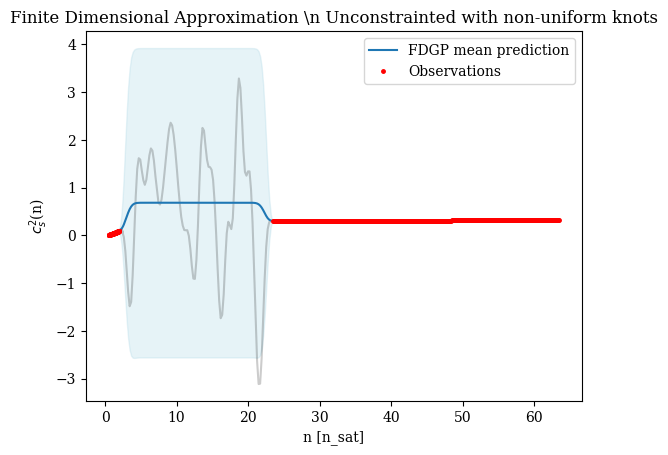

In [ ]:
knot_test_fdgp = (fdgp.knots * (fdgp.x_max - fdgp.x_min))+ fdgp.x_min

cs2_test_fdgp = fdgp.mean_star
sig_fdgp = np.sqrt(np.diag(fdgp.cov_star))

plt.rcParams["font.family"] = "serif"

for i in range(1):
    rng = np.random.default_rng()
    y = rng.multivariate_normal(mean=fdgp.mean_star, cov=fdgp.cov_star)
    plt.plot(knot_test_fdgp, y, color="black", alpha=0.2)

plt.plot(knot_test_fdgp, cs2_test_fdgp, label=f'FDGP mean prediction')
plt.plot(n, cs2, 'r.', markersize=5, label='Observations')
plt.fill_between(knot_test_fdgp.ravel(), cs2_test_fdgp - 1.96 * sig_fdgp, cs2_test_fdgp + 1.96 * sig_fdgp, alpha=0.3, color='lightblue')
plt.xlabel('n [n_sat]')
plt.ylabel(r'$c_s^2$(n)')
plt.title(f"l={l_hat:.3f}, sigma={sigma_hat:.3f}, cs2_hat={cs2_hat:.3f}, X_hat={X_hat:.3f}")
plt.title(fr"Finite Dimensional Approximation \n Unconstrainted with non-uniform knots")

plt.legend()
plt.show()

In [ ]:
constr = fdgp.set_constraints(fdgp.m, constraint_type='boundedness', l = 0, u=1, rm_inf=True)

constr_cs2 = fdgp.compute_MAP()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          540     M =           10

At X0         0 variables are exactly at the bounds

At iterate    0    f= -1.01431D+06    |proj g|=  0.00000D+00

           * * *

Tit   = total number of iterations
Tnf   = total number of function evaluations
Tnint = total number of segments explored during Cauchy searches
Skip  = number of BFGS updates skipped
Nact  = number of active bounds at final generalized Cauchy point
Projg = norm of the final projected gradient
F     = final function value

           * * *

   N    Tit     Tnf  Tnint  Skip  Nact     Projg        F
  540      0      1      0     0     0   0.000D+00  -1.014D+06
  F =  -1014314.8821624501     

CONVERGENCE: NORM_OF_PROJECTED_GRADIENT_<=_PGTOL            


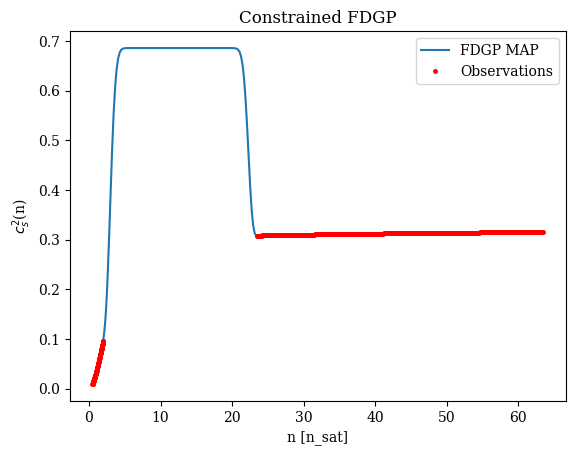

In [ ]:
plt.plot(knot_test_fdgp, constr_cs2, label='FDGP MAP')
plt.plot(n, cs2, 'r.', markersize=5, label='Observations')
plt.xlabel('n [n_sat]')
plt.ylabel(r'$c_s^2$(n)')
plt.title("Constrained FDGP")
plt.legend()
plt.show()

In [ ]:
samples = fdgp.sample_posterior(5,return_trace=False)

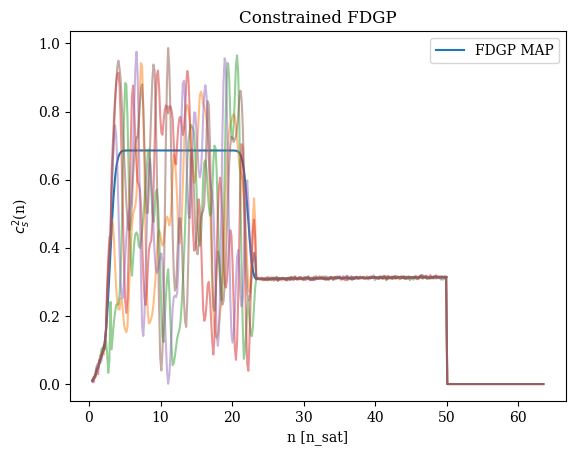

In [ ]:
cs2_constrained = np.asarray([
    [
        sum(samples[i][j] * fdgp._phi_j(j, x) for j in range(fdgp.m))
        for x in fdgp.x_test
    ]
    for i in range(samples.shape[0])
])

x_test_fdgp = (fdgp.x_test * (fdgp.x_max - fdgp.x_min)) + fdgp.x_min
plt.plot(knot_test_fdgp, constr_cs2, label='FDGP MAP')
for i in range(0, samples.shape[0]):
    plt.plot(x_test_fdgp, cs2_constrained[i], alpha = 0.5)
#plt.plot(n, cs2, 'r.', markersize=5, label='Observations')
plt.xlabel('n [n_sat]')
plt.ylabel(r'$c_s^2$(n)')
plt.title("Constrained FDGP")
plt.legend()
plt.show()

In [ ]:
x_test_fdgp[-1]

63.516338016005356

In [ ]:
knot_test_fdgp[-1]

50.0

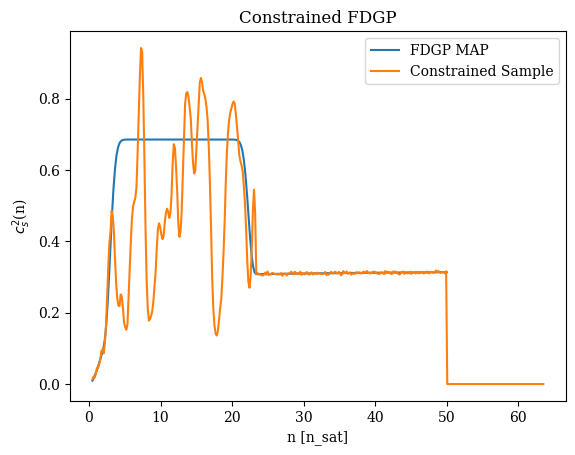

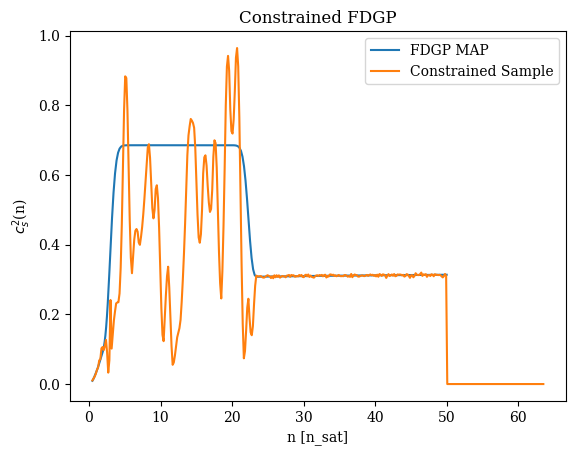

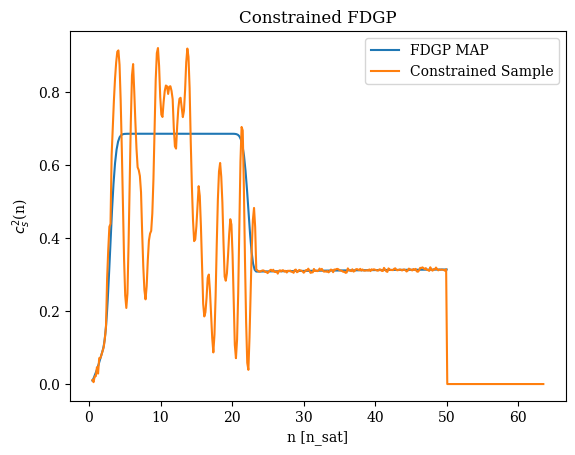

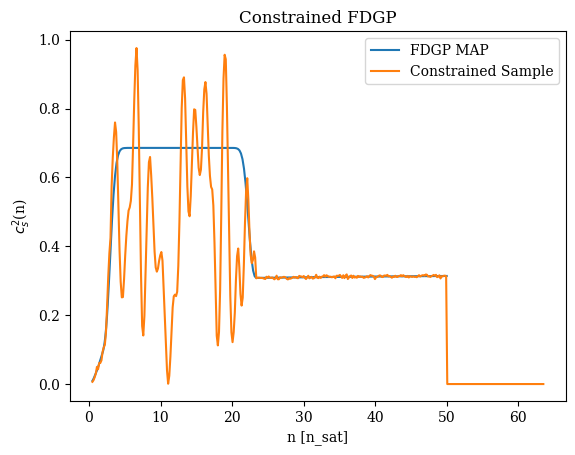

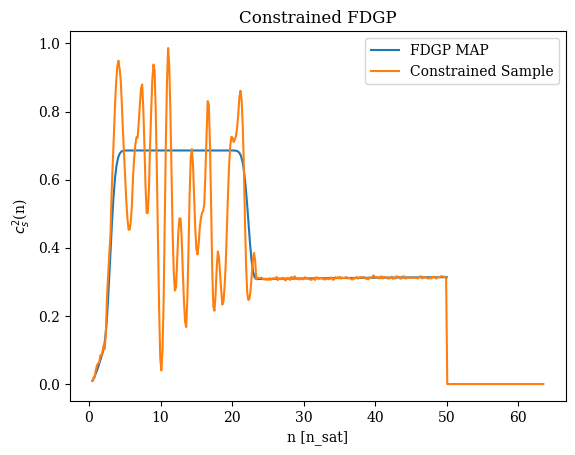

In [ ]:
for i in range(0, samples.shape[0]):
    plt.plot(knot_test_fdgp, constr_cs2, label='FDGP MAP')
    plt.plot(x_test_fdgp, cs2_constrained[i], label='Constrained Sample')
    plt.xlabel('n [n_sat]')
    plt.ylabel(r'$c_s^2$(n)')
    plt.title("Constrained FDGP")
    plt.legend()
    plt.show()
#plt.plot(n, cs2, 'r.', markersize=5, label='Observations')


# integral observations

condition on singular X cs2 and mu seems to be working?

In [100]:
def integral_phi_j(knots, j, x_i, x0, x):
    """ 
    Inputs:
    - knots: np.ndarray 
      normalised knots. just plug in the knots in FDGP that you initiated, they are normalised already
    - j: int 
      index of knot
    - x_i: float
      unnormalised upper bound of the integral
    - x0: float
      unnormalised lower bound of the integral
    - x: np.ndarray
      unnormalised array of datapoints, that is initial x_train supplied to FDGP. used to normalise the others
    
    Output:
    - L_phi_j: np.ndarray
      the row containing the basis function for the integral observation

    To be used with FDGP class
    This function defines a row for integral observations corresponding to $\int^{x_i}_{x_0} f(x)/x dx$
    Basis functions are hat functions.
    """

    L_phi_j = 0

    beta = np.min(x)
    alpha = np.max(x) - beta
    x_i_norm = (x_i - beta)/alpha
    #x0_norm = (x0 - beta)/alpha
    x0_norm = max((x0 - beta)/alpha, 1e-12)   # instead of exactly 0

    if j < 0 or j >= len(knots):
        print(len(knots))
        raise IndexError(f"j={j} is out of bounds for knots of length {len(knots)}")

    m = len(knots)
    t_j = knots[j]
    if j == 0:
        t_j_m = -np.inf
    else:
        t_j_m = knots[j-1]
    if j == m-1:
        t_j_p = np.inf
    else:
        t_j_p = knots[j+1]

    r_ub = min(x_i_norm, t_j_p)
    r_lb = max(x0_norm, t_j)

    l_ub = min(x_i_norm, t_j)
    l_lb = max(x0_norm, t_j_m)

    if r_ub>r_lb:
      right_side = (1/(t_j_p-t_j) *
                  (
                      ((((alpha*t_j_p - beta)/alpha)
                          * np.log((alpha*r_ub) + beta))
                          - r_ub)
                    -((((alpha*t_j_p - beta)/alpha)
                          * np.log((alpha*r_lb) + beta))
                          - r_lb)
                  )
                  )
      L_phi_j += right_side

    if l_ub>l_lb:
      left_side = (1/(t_j-t_j_m) *
                  (
                      (l_ub 
                        - ((beta + alpha*t_j_m)/alpha
                        * np.log((alpha*l_ub) + beta)))
                    -(l_lb
                      - ((beta + alpha*t_j_m)/alpha
                      * np.log((alpha*l_lb) + beta)))
                  )
                  )
      L_phi_j += left_side

    return L_phi_j

In [5]:
def integral_phi_j_num(knots, j, x_i, x0, x, nsamples: int = 1000):
    """
    Numerically evaluate
        ∫_{x0}^{x_i} φ_j(x) / x  dx
    where φ_j is the j-th triangular (hat) basis over the knot set `knots`.

    Parameters
    ----------
    knots : 1-D ndarray
        Knot positions **in the same physical units as x_i, x0, x**.
    j     : int
        Index of the hat basis (0 ≤ j < len(knots)).
    x_i   : float
        Integration upper limit (physical units).
    x0    : float
        Integration lower limit   (physical units).
    x     : 1-D ndarray
        The original training x-array – used only to reproduce the *same*
        0-to-1 normalisation that FDGP uses internally.
    nsamples : int, optional
        Number of trapezoid panels to use (default 1000;  100–200 already
        gives ∼ 1 e-6 accuracy).

    Returns
    -------
    float
        Numerical value of the integral.
    """
    # --- 0 → 1 normalisation identical to FDGP ----------------------------
    beta  = np.min(x)
    alpha = np.max(x) - beta

    # physical integration grid  (ascending order even if x_i < x0)
    xi_grid = np.linspace(x0, x_i, nsamples + 1)

    # φ_j evaluated in PHYSICAL x  ----------------------------------------
    def phi_j_physical(x_val: float) -> float:
        u = (x_val - beta) / alpha          # normalised coordinate 0 … 1
        t_j   = knots[j]
        t_jm1 = knots[j-1] if j > 0         else -np.inf
        t_jp1 = knots[j+1] if j < len(knots)-1 else  np.inf

        if   t_jm1 <= u <= t_j:             # rising edge
            return (u - t_jm1) / (t_j - t_jm1)
        elif t_j <= u <= t_jp1:             # falling edge
            return (t_jp1 - u) / (t_jp1 - t_j)
        else:                               # outside support
            return 0.0

    # vectorise for speed
    phi_vals = np.fromiter((phi_j_physical(xx) for xx in xi_grid),
                           dtype=float, count=xi_grid.size)

    # trapezoidal ∫ φ_j(x) / x  dx
    integrand = phi_vals / xi_grid
    return np.trapz(integrand, xi_grid)


In [303]:
n_ceft, cs2_ceft, cs2_l, cs2_u = anal.get_ceft_cs2()
n_ceft = n_ceft*0.16
cs2_ceft_sigma = pc.CI_to_sigma(cs2_u-cs2_l)
cs2_hat, X_hat, sigma_hat, l_hat, alpha_hat = sam.get_hype_samples()
n_pqcd, cs2_pqcd = pp.get_pqcd(X_hat, size=200)
n_pqcd = n_pqcd*0.16


cs2_pqcd_sigma = np.full_like(cs2_pqcd, 0.01)



indices = np.arange(0, len(n_ceft), 1)
n = np.concatenate((n_ceft[indices], n_pqcd))
cs2 = np.concatenate((cs2_ceft[indices], cs2_pqcd))
cs2_sigma = np.concatenate((cs2_ceft_sigma[indices], cs2_pqcd_sigma))

In [304]:
s = 200

n_pqcd_int, _ = pp.get_pqcd(X_hat, size=s)
n_pqcd_int = n_pqcd_int*0.16
mu_pqcd = np.linspace(2.2, 2.8, s)*1000
e_ini, p_ini, n_ini, mu_ini = anal.get_ceft_ini()
pqcd_int_obs = np.log(mu_pqcd/mu_ini)

n_ceft_int, mu_ceft_avg, mu_ceft_lower, mu_ceft_upper = anal.get_ceft("mu")
ceft_int_obs_lower = np.log(mu_ceft_lower/mu_ini)
ceft_int_obs_upper = np.log(mu_ceft_upper/mu_ini)



ceft_int_obs = (ceft_int_obs_upper+ceft_int_obs_lower)/2
ceft__int_sigma = pc.CI_to_sigma(ceft_int_obs_upper-ceft_int_obs_lower)



pqcd_var_obs = np.full_like(pqcd_int_obs, 0.01)


indices = []#np.arange(0, len(n_ceft), 1)
n_int = np.concatenate((n_ceft_int[indices], n_pqcd_int))
int_obs = np.concatenate((ceft_int_obs[indices], pqcd_int_obs))
int_sigma = np.concatenate((ceft__int_sigma[indices], pqcd_var_obs))

In [305]:
l_hat = 0.25

In [306]:
knot = generate_custom_knots_by_count(15,30,30, 
        transition_width=1, 
        strength=1000,
        region1=(n_ceft[0], n_ceft[-1]),
        trans1=(n_ceft[-1], n_ceft[-1]+1),
        region2=(n_ceft[-1]+1, n_pqcd[0]-1),
        trans2=(n_pqcd[0]-1, n_pqcd[0]),
        region3=(n_pqcd[0], n_pqcd[-1]))

kernel = kernels.Kernel('SE', sigma=sigma_hat, l=l_hat)
x_test = np.linspace(n[0]/0.16, 40, 400)*0.16

#fdgp = finitedimensionalgp.FDGP(kernel, n, cs2, x_test, cs2_sigma, cs2_hat, True, knots=knot, sampling=False, jitter_value=1e-8)
fdgp = finitedimensionalgp.FDGP(kernel, n, cs2, x_test, cs2_sigma, cs2_hat, True, m=100, sampling=False, jitter_value=1e-8)

In [307]:
Phi_int = np.array([
    [ integral_phi_j(
          knots=fdgp.knots,
          j=j,
          x_i=x_i,
          x0=n_ini,
          x=n
      )
      for j in fdgp.js ]
    for x_i in n_int
])


fdgp.add_linear_observations(Phi_int, int_obs, int_sigma)
fdgp.fit()

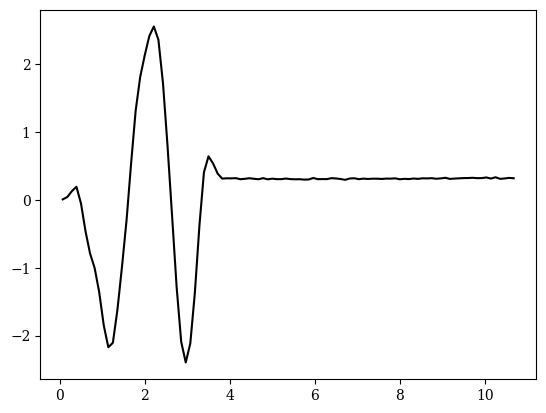

In [308]:
knot_test_fdgp = (fdgp.knots * (fdgp.x_max - fdgp.x_min))+ fdgp.x_min

cs2_test_fdgp = fdgp.mean_star
sig_fdgp = np.sqrt(np.diag(fdgp.cov_star))

plt.rcParams["font.family"] = "serif"

rng = np.random.default_rng()
y = rng.multivariate_normal(mean=fdgp.mean_star, cov=fdgp.cov_star)
plt.plot(knot_test_fdgp, y, color="black", alpha=1)
plt.show()

In [309]:
constr = fdgp.set_constraints(constraint_type='boundedness', m = fdgp.m, l = 0, u=1, rm_inf=True)

import cvxpy as cp
from scipy.linalg import cholesky, cho_solve


# Cholesky for efficient inverse
L = cholesky(fdgp.cov_star + 1e-8 * np.eye(fdgp.m), lower=True, check_finite=False)
Gamma_inv = cho_solve((L, True), np.eye(fdgp.m), check_finite=False)
r = Gamma_inv @ fdgp.mean_star
fdgp.cov_star_inverse=Gamma_inv
Q = Gamma_inv
c = -r
M = fdgp.constraints["M"]
g = fdgp.constraints["g"]

x = cp.Variable(fdgp.m)
objective = 0.5 * cp.quad_form(x, cp.psd_wrap(Q)) + c @ x
constraints = [M @ x + g >= 0]
problem = cp.Problem(cp.Minimize(objective), constraints)

# Solve the QP
problem.solve(solver=cp.PROXQP, verbose=True)

# Check status
if problem.status not in ["optimal", "optimal_inaccurate"]:
    raise RuntimeError(f"CVXPY failed: {problem.status}")

# Store the MAP
fdgp.map = x.value
xi_map = fdgp.map

(CVXPY) Jul 05 12:35:22 PM: Your problem has 100 variables, 200 constraints, and 0 parameters.
(CVXPY) Jul 05 12:35:22 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jul 05 12:35:22 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jul 05 12:35:22 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jul 05 12:35:22 PM: Your problem is compiled with the CPP canonicalization backend.
(CVXPY) Jul 05 12:35:22 PM: Compiling problem (target solver=PROXQP).
(CVXPY) Jul 05 12:35:22 PM: Reduction chain: CvxAttr2Constr -> Qp2SymbolicQp -> QpMatrixStuffing -> PROXQP
(CVXPY) Jul 05 12:35:22 PM: Applying reduction CvxAttr2Constr
(CVXPY) Jul 05 12:35:22 PM: Applying reduction Qp2SymbolicQp
(CVXPY) Jul 05 12:35:22 PM: Applying reduction QpMatrixStuffing
(CVXPY) Jul 05 12:35:22 PM: Applying reduction PROXQP
(CVXPY) Jul 05 12:35:22 PM: Finished problem compil

                                     CVXPY                                     
                                     v1.6.6                                    
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
-------------------------------------------------------------------------------
                                Numerical solver                               
-------------------------------------------------------------------------------
-------------------------------------------------------------------------------
                                    Summary                                    
-------------------------------------------------------------------------------


In [ ]:
constr = fdgp.set_constraints(fdgp.m, constraint_type='boundedness', l = 0, u=1, rm_inf=True)

xi_map = fdgp.compute_MAP()

RUNNING THE L-BFGS-B CODE

           * * *

Machine precision = 2.220D-16
 N =          370     M =           10

At X0        32 variables are exactly at the bounds

At iterate    0    f= -2.83015D+06    |proj g|=  1.00000D+00

At iterate    1    f= -2.83031D+06    |proj g|=  9.92177D-01

At iterate    2    f= -2.83070D+06    |proj g|=  1.00000D+00

At iterate    3    f= -2.83088D+06    |proj g|=  1.00000D+00

At iterate    4    f= -2.83094D+06    |proj g|=  1.00000D+00

At iterate    5    f= -2.83099D+06    |proj g|=  1.00000D+00

At iterate    6    f= -2.83101D+06    |proj g|=  1.00000D+00

At iterate    7    f= -2.83102D+06    |proj g|=  9.98894D-01

At iterate    8    f= -2.83102D+06    |proj g|=  9.97890D-01

At iterate    9    f= -2.83102D+06    |proj g|=  9.99657D-01

At iterate   10    f= -2.83102D+06    |proj g|=  9.99015D-01

At iterate   11    f= -2.83102D+06    |proj g|=  9.99010D-01

At iterate   12    f= -2.83102D+06    |proj g|=  9.98808D-01

At iterate   13    f= -2.8

In [228]:
res_int = Phi_int @ fdgp.map - int_obs
print("max |integral residual| :", np.abs(res_int).max())   # ≲ 1e-12

scale = (Phi_int @ fdgp.map) / int_obs
print("scale range:", scale.min(), scale.max())

max |integral residual| : 2.264540575687006
scale range: -1.2300680882381814 -1.0993860199761174


In [229]:
alpha = np.max(n) - np.min(n)      # same α used in integral_phi_j
test_row = 0, 0
ana = Phi_int[test_row]            # current analytic value
ana_scaled = ana * alpha           # apply Jacobian once
print("scaled / original :", ana_scaled / ana)        # should be 0.16


scaled / original : 9.655762885929677


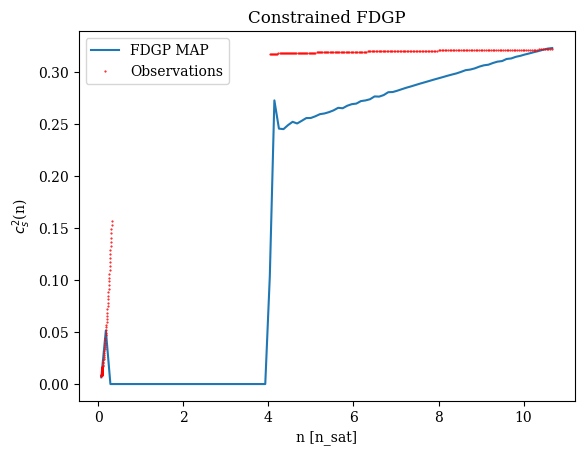

In [310]:
plt.plot(knot_test_fdgp, fdgp.map, label='FDGP MAP')
plt.plot(n, cs2, 'r.', markersize=1, label='Observations')
plt.xlabel('n [n_sat]')
plt.ylabel(r'$c_s^2$(n)')
plt.title("Constrained FDGP")
plt.legend()
plt.show()

### testing

In [293]:
# A.  Γ  must still be SPD and well-conditioned
print(f"cond(Γ)     = {np.linalg.cond(fdgp.Gamma):.3g}")

# B.  Posterior Σ* must be SPD
print(f"cond(Σ*)    = {np.linalg.cond(fdgp.cov_star):.3g}")

# C.  MAP vector must satisfy every constraint row
viol = fdgp.constraints["M"] @ fdgp.map + fdgp.constraints["g"]
print("constraint buffer (min) =", np.min(viol))   # should be ≥ 0

# D.  All integral rows finite
print("any NaN/Inf in Φ_int? ->", not np.isfinite(Phi_int).all())


cond(Γ)     = 1.04e+05
cond(Σ*)    = 1.15e+11
constraint buffer (min) = -7.993605777301127e-15
any NaN/Inf in Φ_int? -> False


In [ ]:
from scipy.optimize import linprog
from scipy.linalg import solve_triangular

# --- original constraints and whitening
f = fdgp.constraints["M"]
g = fdgp.constraints["g"]
R = cholesky(fdgp.cov_star + 1e-8 * np.eye(fdgp.m), lower=True, check_finite=False)
r = fdgp.mean_star

R_inv   = solve_triangular(R, np.eye(R.shape[0]), lower=True)

Minv_r  = fdgp.cov_star_inverse @ r

f2 = f @ R_inv
g2 = f @ Minv_r + g

m, d = f2.shape

# --- slack LP in whitened space z ∈ ℝ^d
A = np.hstack([-f2, -np.ones((m, 1))])
b = g2 - 1e-4      # we want: f2 z + g2 ≥ 1e-4

res = linprog(c       = np.r_[np.zeros(d), 1],    # minimise slack t
              A_ub    = A,
              b_ub    = b,
              bounds  = [(None, None)] * d + [(None, None)],
              method  = "highs")

if not res.success or res.x[-1] > 0:
    raise RuntimeError("Constraints infeasible or t > 0")

z0 = res.x[:-1]                      # interior point in whitened space

# --- backtransform to original coordinates
x0 = R_inv @ z0 + Minv_r

fdgp.map = x0

# --- check slack
min_slack = (f2 @ z0 + g2).min()
print("✅ min slack in whitened space:", min_slack)


✅ min slack in whitened space: 0.49999999645842763


In [235]:
print("Min slack before sampling:", (f2 @ z0 + g2).min())
print("Norm range of f2 rows:", np.linalg.norm(f2, axis=1).min(), "–", np.linalg.norm(f2, axis=1).max())


Min slack before sampling: 0.49999999645842763
Norm range of f2 rows: 46.18872400803446 – 8860.967757696742


In [236]:
from scipy.optimize import linprog

m, d = f2.shape
res = linprog(c            = np.zeros(d),      # just find *any* point
              A_ub         = -f2,              # because we need f2 z + g2 ≥ 0
              b_ub         = g2,
              bounds       = [(1e-10, 1-1e-10)]*d,   # keep 0–1 box
              method       = "highs",
              options      = {"presolve": True})

print("LP success :", res.success)
print("status     :", res.status)       # 2 = infeasible, 3 = unbounded, …
print(res.message)  
if res.success:
    print("min slack :", (f2 @ res.x + g2).min())

LP success : False
status     : 2
The problem is infeasible. (HiGHS Status 8: model_status is Infeasible; primal_status is At lower/fixed bound)


In [311]:
violations = fdgp.constraints["M"] @ fdgp.map + fdgp.constraints["g"]

print("Minimum slack:", violations.min())
print("Number of violated constraints:", np.sum(violations < 0))


Minimum slack: -5.422656311773478e-11
Number of violated constraints: 35


### end

In [313]:
samples = fdgp.sample_posterior(1,return_trace=False, burn_in=1) # hmc

#samples = sample_posterior(fdgp, 10, eta = 20, burn_in=10, update_eta=False) # LS_ESS

ValueError: Max iterations reached

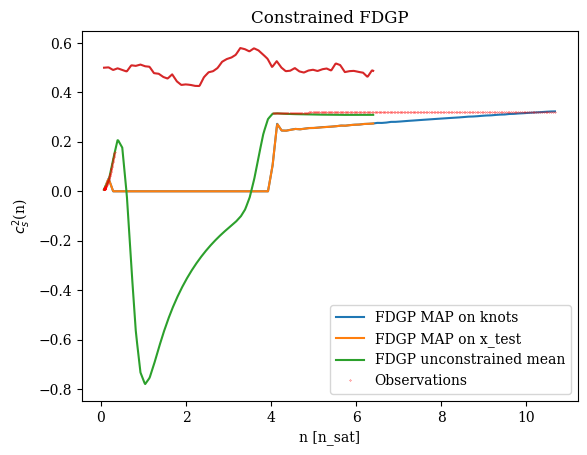

In [315]:
Phi_test = np.array([
    [fdgp._phi_j(j, x) for x in fdgp.x_test]
    for j in range(fdgp.m)
])

#cs2_constrained = samples @ Phi_test
map_cs2 = fdgp.map @ Phi_test
mean_cs2 = fdgp.mean_star @ Phi_test

x_test_fdgp = (fdgp.x_test * (fdgp.x_max - fdgp.x_min)) + fdgp.x_min
plt.plot(knot_test_fdgp, xi_map, label='FDGP MAP on knots')

plt.plot(x_test_fdgp, map_cs2, label='FDGP MAP on x_test') # discrepency because fdgp.map gets projected to x0, a feasible but unconditioned point

plt.plot(x_test_fdgp, mean_cs2, label='FDGP unconstrained mean')

for i in range(0, samples.shape[0]):
    plt.plot(x_test_fdgp, cs2_constrained[i], alpha = 1)
plt.plot(n, cs2, 'r.', markersize=0.5, label='Observations')
plt.xlabel('n [n_sat]')
plt.ylabel(r'$c_s^2$(n)')
plt.title("Constrained FDGP")
plt.legend()
plt.show()


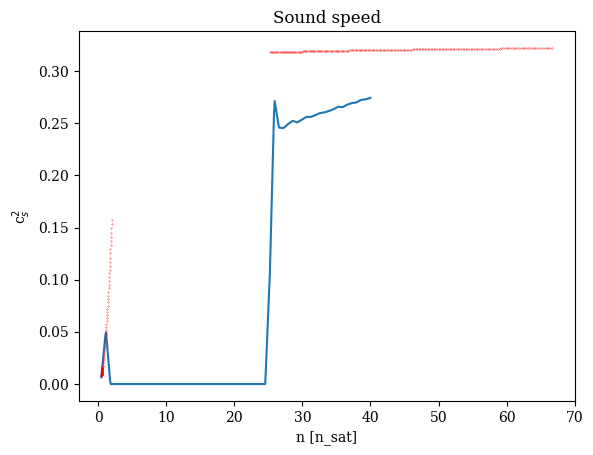

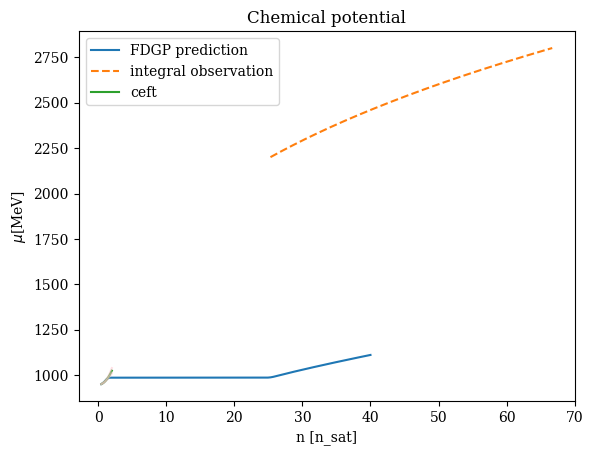

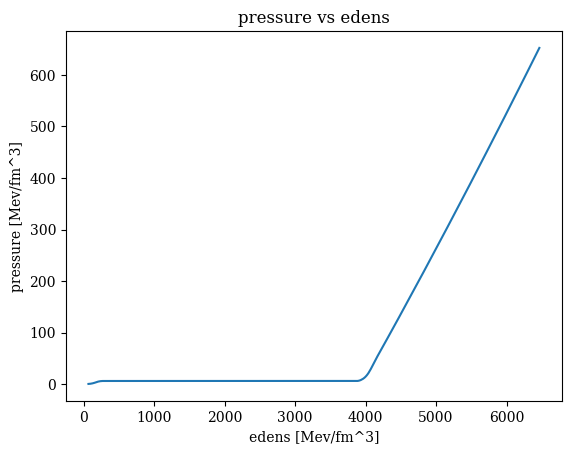

In [318]:
x_test_ns = x_test/0.16

EOS = eos.EosProperties(x_test_ns, phi=None, epsi_0 = e_ini, p_0 = p_ini, mu_0=mu_ini,  cs2=map_cs2)
eos_prop_results = EOS.get_all()


plt.plot(x_test_ns, eos_prop_results['cs2'].flatten())
plt.plot(n/ns, cs2, 'r.', markersize=0.5, label='Observations')

plt.xlabel('n [n_sat]')
plt.ylabel(r'c$_s^2$')
plt.title(f"Sound speed")
plt.show()

plt.plot(x_test_ns, eos_prop_results["mu"].flatten(), label = "FDGP prediction")
plt.plot(n_pqcd_int/0.16, mu_pqcd, "--", label = "integral observation")
plt.plot(n_ceft_int, mu_ceft_avg, label = "ceft")
plt.plot(n_ceft_int, mu_ceft_upper, color = 'pink', alpha=0.5)
plt.plot(n_ceft_int, mu_ceft_lower, color = 'pink', alpha=0.5)


plt.title("Chemical potential")
plt.xlabel('n [n_sat]')
plt.ylabel(r'$\mu$[MeV]')
plt.legend()

#plt.xlim(0,5)
#plt.ylim(900,1300)

plt.show()

plt.plot(eos_prop_results["epsilon"].flatten(), eos_prop_results["pressure"].flatten())
plt.xlabel(r"edens [Mev/fm^3]")
plt.ylabel(r'pressure [Mev/fm^3]')
plt.title("pressure vs edens")
plt.show()

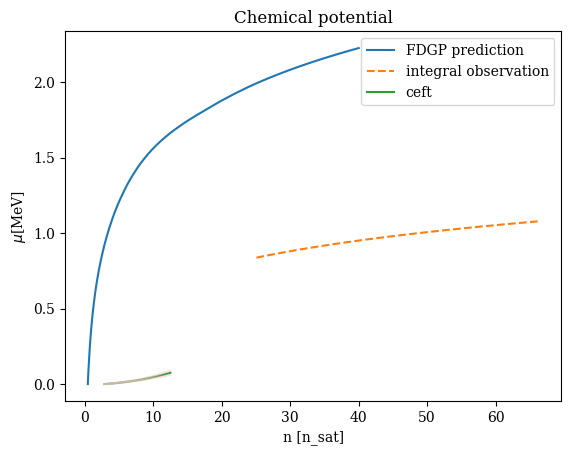

In [703]:
plt.plot(x_test_ns, np.log(eos_prop_results["mu"][1]/mu_ini), label = "FDGP prediction")
plt.plot(n_pqcd_int/0.16, np.log(mu_pqcd/mu_ini), "--", label = "integral observation")
plt.plot(n_ceft_int/0.16, np.log(mu_ceft_avg/mu_ini), label = "ceft")
plt.plot(n_ceft_int/0.16, np.log(mu_ceft_upper/mu_ini), color = 'pink', alpha=0.5)
plt.plot(n_ceft_int/0.16, np.log(mu_ceft_lower/mu_ini), color = 'pink', alpha=0.5)


plt.title("Chemical potential")
plt.xlabel('n [n_sat]')
plt.ylabel(r'$\mu$[MeV]')
plt.legend()

#plt.xlim(0,2.1)
#plt.ylim(0,0.1)

Add chem pot for ceft

# pQCD as lin ineq

### inspection

In [6]:
grid_size = 25

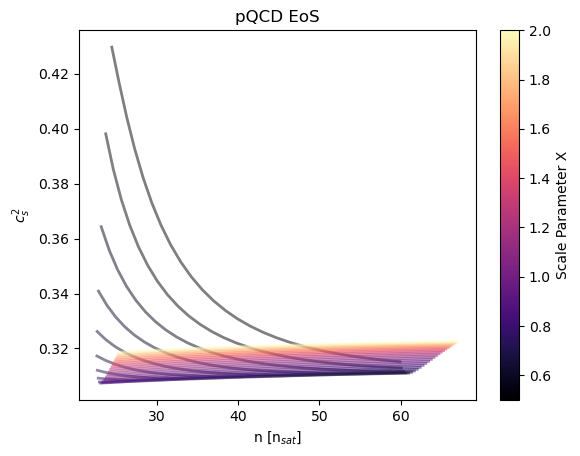

In [7]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

mu_grid = np.linspace(2.2, 3, grid_size)

pQCD1 = pQCD(1/2)  
pQCD2 = pQCD(2)    
array = np.geomspace(1/2, 2, grid_size)

norm = mcolors.Normalize(vmin=array.min(), vmax=array.max())
colormap = cm.magma
for i in array:
    pQCDx = pQCD(i)
    color = colormap(norm(i)) 
    plt.plot(np.vectorize(pQCDx.number_density)(mu_grid)/0.16, 
             np.vectorize(pQCDx.speed2)(mu_grid), 
             color=color, alpha=0.5,
             linewidth=2)


sm = cm.ScalarMappable(cmap=colormap, norm=norm)
sm.set_array(array)  
cbar = plt.colorbar(sm, ax=plt.gca()) 
cbar.set_label('Scale Parameter X')

plt.ylabel('$c_s^2$')
plt.xlabel('n [n$_{sat}$]')
plt.title('pQCD EoS')
plt.show()

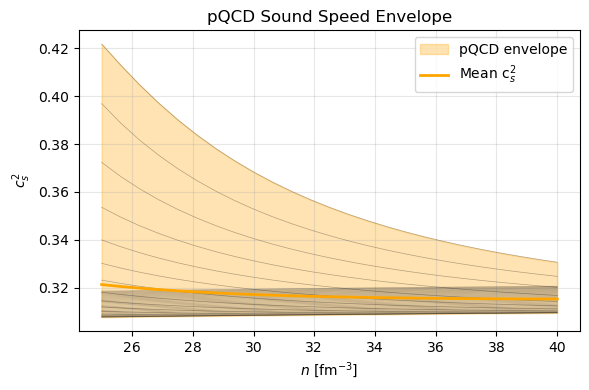

In [8]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Set up the n grid and X samples
n_pqcd_grid = np.linspace(25, 40, grid_size) * 0.16   # fm⁻³
X_grid = np.geomspace(0.5, 2.0, 40)              # or use np.geomspace

# 2. Generate c_s² curves for each X
cs2_family = []
for X in X_grid:
    n_raw, cs2_raw = pp.get_pqcd(X)
    n_raw = n_raw * 0.16                        # convert to fm⁻³
    cs2_interp = np.interp(n_pqcd_grid, n_raw, cs2_raw)
    cs2_family.append(cs2_interp)

cs2_family = np.array(cs2_family)               # shape: (n_X, n_n)
cs2_min = cs2_family.min(axis=0)
cs2_max = cs2_family.max(axis=0)
cs2_mean = cs2_family.mean(axis=0)

# 3. Plotting the envelope

plt.figure(figsize=(6, 4))
for cs2 in cs2_family:
    plt.plot(n_pqcd_grid/0.16, cs2, lw=0.5, alpha=0.3, color='black')

plt.fill_between(n_pqcd_grid/0.16, cs2_min, cs2_max, color='orange', alpha=0.3, label='pQCD envelope')
plt.plot(n_pqcd_grid/0.16, cs2_mean, color='orange', lw=2, label='Mean c$_s^2$')
plt.xlabel(r'$n$ [fm$^{-3}$]')
plt.ylabel(r'$c_s^2$')
plt.title('pQCD Sound Speed Envelope')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


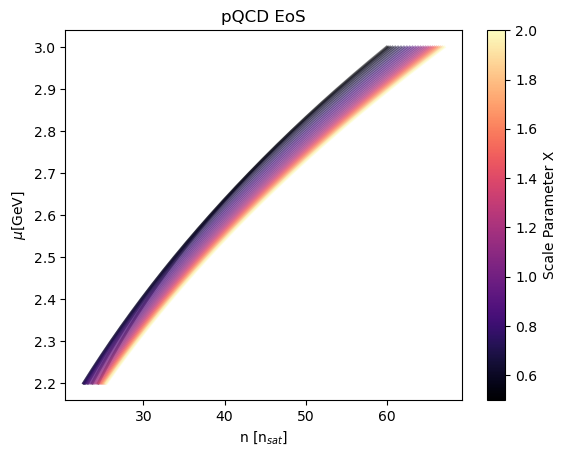

In [9]:
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import matplotlib.colors as mcolors

mu_grid = np.linspace(2.2, 3, grid_size)

pQCD1 = pQCD(1/2)  
pQCD2 = pQCD(2)    
array = np.geomspace(1/2, 2, grid_size)

norm = mcolors.Normalize(vmin=array.min(), vmax=array.max())
colormap = cm.magma
for i in array:
    pQCDx = pQCD(i)
    color = colormap(norm(i)) 
    plt.plot(np.vectorize(pQCDx.number_density)(mu_grid)/0.16, 
             mu_grid, 
             color=color, alpha=0.5,
             linewidth=2)


sm = cm.ScalarMappable(cmap=colormap, norm=norm)
sm.set_array(array)  
cbar = plt.colorbar(sm, ax=plt.gca()) 
cbar.set_label('Scale Parameter X')

plt.ylabel('$\mu$[GeV]')
plt.xlabel('n [n$_{sat}$]')
plt.title('pQCD EoS')
plt.show()

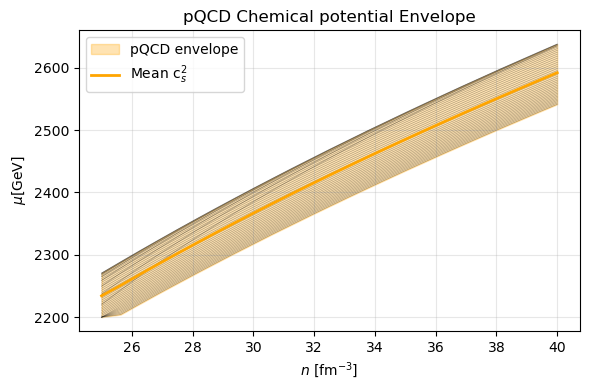

In [10]:
import numpy as np
import matplotlib.pyplot as plt

# 1. Set up the n grid and X samples

n_pqcd_grid = np.linspace(25, 40, grid_size) * 0.16   # fm⁻³
X_grid = np.geomspace(0.5, 2.0, 40)              # or use np.geomspace
mu_pqcd_grid = np.linspace(2.2,3,grid_size)*1000
# 2. Generate c_s² curves for each X
mu_family = []
for X in X_grid:
    n_raw, cs2_raw = pp.get_pqcd(X, size=grid_size)
    n_raw = n_raw * 0.16                        # convert to fm⁻³
    mu_interp = np.interp(n_pqcd_grid, n_raw, mu_pqcd_grid)
    mu_family.append(mu_interp)

mu_family = np.array(mu_family)               # shape: (n_X, n_n)
mu_min = mu_family.min(axis=0)
mu_max = mu_family.max(axis=0)
mu_mean = mu_family.mean(axis=0)

# 3. Plotting the envelope

plt.figure(figsize=(6, 4))
for mu in mu_family:
    plt.plot(n_pqcd_grid/0.16, mu, lw=0.5, alpha=0.3, color='black')

plt.fill_between(n_pqcd_grid/0.16, mu_min, mu_max, color='orange', alpha=0.3, label='pQCD envelope')
plt.plot(n_pqcd_grid/0.16, mu_mean, color='orange', lw=2, label='Mean c$_s^2$')
plt.xlabel(r'$n$ [fm$^{-3}$]')
plt.ylabel(r'$\mu$[GeV]')
plt.title('pQCD Chemical potential Envelope')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


### pqcd cs2 inequality

In [11]:
scale = 1

In [12]:
n_ceft, cs2_ceft, cs2_l, cs2_u = anal.get_ceft_cs2()
cs2_ceft_sigma = pc.CI_to_sigma(cs2_u-cs2_l)
cs2_hat, X_hat, sigma_hat, l_hat, alpha_hat = sam.get_hype_samples()

cs2_ceft = cs2_ceft * scale

n = n_ceft*ns
cs2 = cs2_ceft
cs2_sigma = cs2_ceft_sigma *scale**2



In [13]:
l_hat = 0.1

In [14]:
#n = n_ceft[1:]*ns
#cs2 = cs2_ceft[1:]
#cs2_sigma = cs2_ceft_sigma[1:] *scale**2
#cs2_sigma = np.zeros_like(cs2_sigma)

#n0 = n_ceft[0]
#cs20 = cs2_ceft[0]

knotss = generate_custom_knots_by_count(20,100,30, 
        transition_width=1, 
        strength=1000,
        region1=(n_ceft[0], n_ceft[-1]),
        trans1=(n_ceft[-1], n_ceft[-1]+1),
        region2=(n_ceft[-1]+1, n_pqcd[0]-1),
        trans2=(n_pqcd[0]-1, n_pqcd[0]),
        region3=(n_pqcd[0], n_pqcd[-1]))

knot1 = np.linspace(n[0], n[-1], 25)
knot2 = np.linspace(n[-1], 40, 76)
knot = np.unique(np.concatenate([knot1,knot2]))

knots = np.linspace(n[0], 40*ns, 100)

kernel = kernels.Kernel('SE', sigma=sigma_hat, l=l_hat)
x_test = np.linspace(n_ceft[0], 40, 400)*ns


#fdgp = finitedimensionalgp.FDGP(kernel, n, cs2, x_test, cs2_sigma, cs2_hat, True, knots=knotss, sampling=False, jitter_value=1e-8, normalise=False)
#fdgp = finitedimensionalgp.FDGP(kernel, n, cs2, x_test, cs2_sigma, cs2_hat, True, knots=knot, sampling=False, jitter_value=1e-8, normalise=False)
fdgp = finitedimensionalgp.FDGP(kernel, n, cs2, x_test, cs2_sigma, cs2_hat, True, knots=knots, sampling=False, jitter_value=1e-8, normalise=False)

## new basis function

In [749]:
def integrate_hat_function(j, a, b, knots):
    t_jm1 = knots[j - 1] if j > 0 else None
    t_j    = knots[j]
    t_jp1 = knots[j + 1] if j < len(knots) - 1 else None

    total = 0.0

    # Left wing
    if t_jm1 is not None:
        left_a = max(a, t_jm1)
        left_b = min(b, t_j)
        if left_a < left_b:
            base = t_j - t_jm1
            total += (1 / base) * ((left_b - t_jm1) ** 2 - (left_a - t_jm1) ** 2) / 2

    # Right wing
    if t_jp1 is not None:
        right_a = max(a, t_j)
        right_b = min(b, t_jp1)
        if right_a < right_b:
            base = t_jp1 - t_j
            def F(x): return t_jp1 * x - 0.5 * x**2
            total += (1 / base) * (F(right_b) - F(right_a))

    return total


In [750]:
def build_phi_matrix_integrated(x_obs, knots, x0=None):
    x_obs = np.asarray(x_obs)
    knots = np.asarray(knots)
    m = len(knots)
    n_obs = len(x_obs)

    if x0 is None:
        x0 = x_obs[0]  # Use first observed x as anchor

    # Initialize Phi: (n_obs, m)
    Phi = np.zeros((n_obs, m))

    for i, xi in enumerate(x_obs):
        for j in range(m):
            Phi[i, j] = integrate_hat_function(j, x0, xi, knots)

    # Augment with offset term (column of ones)
    Phi_aug = np.hstack([np.ones((n_obs, 1)), Phi])  # shape (n_obs, m+1)
    return Phi_aug

Phi = build_phi_matrix_integrated(
    x_obs=fdgp.x_train,
    knots=fdgp.knots,
    x0=fdgp.x_train[0]       # or any domain anchor
)

In [751]:
import numpy as np
from typing import Callable

def build_gamma(knots: np.ndarray, kernel,
                dk_dx,
                dk_dxp,
                d2k_dx_dxp) -> np.ndarray:
    """
    Constructs the Gamma matrix for the (M_phi) model:
    Γ = Cov([Y(0), Y'(t1), ..., Y'(tN)])
    
    Parameters
    ----------
    knots : np.ndarray
        The array of knot locations t1, ..., tN
    kernel : callable
        k(x, x')
    dx_kernel : callable
        ∂k/∂x (x, x')
    dxp_kernel : callable
        ∂k/∂x' (x, x')
    dxdxp_kernel : callable
        ∂²k/∂x∂x' (x, x')
    
    Returns
    -------
    Gamma : np.ndarray
        (N+1, N+1) covariance matrix
    """
    N = len(knots)
    Gamma = np.zeros((N+1, N+1))

    Gamma[0, 0] = kernel(np.asarray([0.0]), np.asarray([0.0])).item()

    # Cross derivatives with Y(0)
    for j in range(N):
        tj = knots[j]
        Gamma[0, j + 1] = dk_dxp(0.0, tj).item()
        Gamma[j + 1, 0] = dk_dx(tj, 0.0).item()

    # Second derivative block
    for i in range(N):
        for j in range(N):
            Gamma[i + 1, j + 1] = d2k_dx_dxp(knots[i], knots[j]).item()

    return Gamma

eps = 1e-5

def dk_dx(x, x_prime):
    return (kernel(np.asarray([x + eps]), np.asarray([x_prime])) - 
            kernel(np.asarray([x - eps]), np.asarray([x_prime]))) / (2 * eps)

def dk_dxp(x, x_prime):
    return (kernel(np.asarray([x]), np.asarray([x_prime + eps])) - 
            kernel(np.asarray([x]), np.asarray([x_prime - eps]))) / (2 * eps)

def d2k_dx_dxp(x, x_prime):
    return (
        kernel(np.asarray([x + eps]), np.asarray([x_prime + eps]))
        - kernel(np.asarray([x + eps]), np.asarray([x_prime - eps]))
        - kernel(np.asarray([x - eps]), np.asarray([x_prime + eps]))
        + kernel(np.asarray([x - eps]), np.asarray([x_prime - eps]))
    ) / (4 * eps ** 2)

kernel = lambda x, x_prime: fdgp.kernel._SE(x, x_prime)

Gamma = build_gamma(fdgp.knots, kernel, dk_dx, dk_dxp, d2k_dx_dxp)


In [752]:
import numpy as np
from scipy.linalg import cholesky, solve_triangular

y_train = fdgp.y_train          # shape (n_obs,)
prior_mean = fdgp.prior_mean    # shape (n_obs,)

f_tilde = y_train - prior_mean  # zero-mean observations

# --- Compute intermediate matrices
PhiGammaPhiT = Phi @ Gamma @ Phi.T
eps = 1e-8  # you can try 1e-6 or 1e-10 depending on your scale
PhiGammaPhiT += eps * np.eye(PhiGammaPhiT.shape[0])

# --- Cholesky solve
L = cholesky(PhiGammaPhiT, lower=True, check_finite=False)
alpha = solve_triangular(L.T, solve_triangular(L, f_tilde, lower=True, check_finite=False), check_finite=False)

PhiGamma = Phi @ Gamma
v = solve_triangular(L, PhiGamma, lower=True, check_finite=False)

# --- Final posterior quantities
mean_star = prior_mean + PhiGamma.T @ alpha             # shape (m,)
cov_star = Gamma - (v.T @ v)                             # shape (m, m)




In [753]:
def build_phi_test_integrated(x_test, knots, x0):
    x_test = np.asarray(x_test)
    m = len(knots)
    n_test = len(x_test)

    Phi_test = np.zeros((n_test, m))

    for i, xi in enumerate(x_test):
        for j in range(m):
            Phi_test[i, j] = integrate_hat_function(j, x0, xi, knots)

    # Add the offset term (column of ones)
    Phi_test_aug = np.hstack([np.ones((n_test, 1)), Phi_test])  # shape (n_test, m+1)
    return Phi_test_aug

Phi_test = build_phi_test_integrated(x_test, fdgp.knots, n0)

# Predictive mean and covariance
f_mean = Phi_test @ mean_star
f_cov = Phi_test @ cov_star @ Phi_test.T


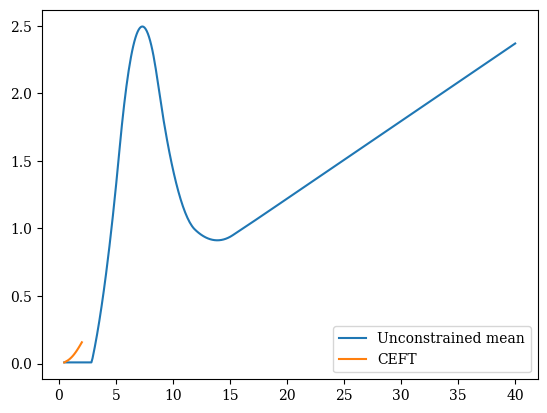

In [754]:
plt.plot(x_test/ns, f_mean, label='Unconstrained mean')
plt.plot(n_ceft, cs2_ceft, label = "CEFT")
plt.legend()
plt.show()

In [718]:
from numpy import vstack, hstack

# For each row of Phi, create two constraints:
# -Phi[i] @ xi <= 0
#  Phi[i] @ xi <= 1

A_ub = vstack([
    -Phi,   # for lower bound: f(x) >= 0 → -f(x) <= 0
     Phi    # for upper bound: f(x) <= 1
])

b_ub = hstack([
    np.zeros(Phi.shape[0]),   # for f(x) >= 0
    np.ones(Phi.shape[0])     # for f(x) <= 1
])


In [719]:
from scipy.integrate import quad
import numpy as np

def build_integral_constraint_matrix(n0, n_i_list, phi_funcs_with_offset):
    """
    Returns Lambda matrix where each row corresponds to one integral constraint:
    ∫ f(n)/n dn over [n0, n_i]
    """
    m_plus_1 = len(phi_funcs_with_offset)
    rows = []

    for n_i in n_i_list:
        row = np.zeros(m_plus_1)
        for j, phi_j in enumerate(phi_funcs_with_offset):
            integrand = lambda n: phi_j(n) / n
            integral_val, _ = quad(integrand, n0, n_i)
            row[j] = integral_val
        rows.append(row)

    return np.array(rows)  # shape: (num_constraints, m+1)


In [707]:
n_i_list = n_pqcd_grid
Lambda = build_integral_constraint_matrix(n0, n_i_list, phi_funcs_with_offset)

/tmp/ipykernel_103605/142027844.py:16: IntegrationWarning: The maximum number of subdivisions (50) has been achieved.
  If increasing the limit yields no improvement it is advised to analyze 
  the integrand in order to determine the difficulties.  If the position of a 
  local difficulty can be determined (singularity, discontinuity) one will 
  probably gain from splitting up the interval and calling the integrator 
  on the subranges.  Perhaps a special-purpose integrator should be used.
  integral_val, _ = quad(integrand, n0, n_i)


KeyboardInterrupt: 

In [721]:
L = cholesky(cov_star + 1e-4* np.eye(m), lower=True, check_finite=False)
Gamma_inv = cho_solve((L, True), np.eye(m), check_finite=False)
r = Gamma_inv @ mean_star

xi = cp.Variable(m)
Q = Gamma_inv
c = -Gamma_inv @ mean_star
l_bounds = np.zeros(A_ub.shape[0])
u_bounds = np.ones(A_ub.shape[0])

constraints = [A_ub @ xi <= u_bounds, A_ub @ xi >= l_bounds]

problem = cp.Problem(cp.Minimize(0.5 * cp.quad_form(xi, cp.psd_wrap(Q)) + c @ xi), constraints)
problem.solve(solver="CLARABEL", verbose=True)
xi_star = xi.value

(CVXPY) Jul 07 12:00:34 PM: Your problem has 101 variables, 396 constraints, and 0 parameters.
(CVXPY) Jul 07 12:00:34 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jul 07 12:00:34 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jul 07 12:00:34 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jul 07 12:00:34 PM: Your problem is compiled with the CPP canonicalization backend.
(CVXPY) Jul 07 12:00:34 PM: Compiling problem (target solver=CLARABEL).
(CVXPY) Jul 07 12:00:34 PM: Reduction chain: Dcp2Cone -> CvxAttr2Constr -> ConeMatrixStuffing -> CLARABEL
(CVXPY) Jul 07 12:00:34 PM: Applying reduction Dcp2Cone
(CVXPY) Jul 07 12:00:34 PM: Applying reduction CvxAttr2Constr
(CVXPY) Jul 07 12:00:34 PM: Applying reduction ConeMatrixStuffing
(CVXPY) Jul 07 12:00:34 PM: Applying reduction CLARABEL
(CVXPY) Jul 07 12:00:34 PM: Finished problem compil

                                     CVXPY                                     
                                     v1.6.6                                    
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
-------------------------------------------------------------------------------
                                Numerical solver                               
-------------------------------------------------------------------------------
-------------------------------------------------------------
           Clarabel.rs v0.11.1  -  Clever Acronym                

                   (c) Paul Goulart                          
                University of Oxford, 2022                   
-------------------------------------------------------------

problem:
  variables     = 101
  constraints

(CVXPY) Jul 07 12:00:34 PM: Problem status: optimal
(CVXPY) Jul 07 12:00:34 PM: Optimal value: -8.388e+03
(CVXPY) Jul 07 12:00:34 PM: Compilation took 3.062e-02 seconds
(CVXPY) Jul 07 12:00:34 PM: Solver (including time spent in interface) took 1.632e-02 seconds


  0  -5.1574e+04  -2.7462e+07  5.31e+02  1.22e-01  7.86e-16  1.00e+00  1.57e+01   ------   
  1  -2.3877e+04  -2.3390e+06  9.70e+01  1.10e-02  5.92e-15  1.21e-01  1.49e+00  9.09e-01  
  2  -1.0536e+04  -2.4204e+05  2.20e+01  9.14e-04  3.82e-15  1.01e-01  1.47e-01  9.87e-01  
  3  -8.7121e+03  -2.8144e+04  2.23e+00  6.83e-05  4.53e-16  9.41e-03  1.16e-02  9.74e-01  
  4  -8.3919e+03  -8.6177e+03  2.69e-02  7.31e-07  1.44e-16  1.09e-04  1.30e-04  9.89e-01  
  5  -8.3883e+03  -8.3906e+03  2.70e-04  7.31e-09  9.60e-16  1.09e-06  1.30e-06  9.90e-01  
  6  -8.3883e+03  -8.3883e+03  2.70e-06  7.31e-11  2.76e-15  1.09e-08  1.30e-08  9.90e-01  
  7  -8.3883e+03  -8.3883e+03  2.70e-08  7.32e-13  8.16e-15  1.09e-10  1.30e-10  9.90e-01  
  8  -8.3883e+03  -8.3883e+03  2.70e-10  7.24e-15  2.86e-15  1.09e-12  1.30e-12  9.90e-01  
---------------------------------------------------------------------------------------------
Terminated with status = Solved
solve time = 10.922152ms
---------------------

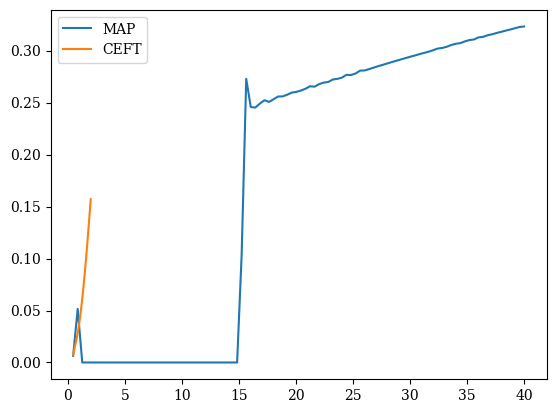

In [722]:
plt.rcParams["font.family"] = "serif"
plt.plot(knot_test_fdgp/ns, xi_map, alpha=1, label='MAP')
plt.plot(n_ceft, cs2_ceft, label = "CEFT")
plt.legend()
plt.show()

In [ ]:
plt.plot()

## old basis function resumes

In [15]:
#boundness_constraint = fdgp.set_constraints(constraint_type='boundedness', m=fdgp.m, l = 0, u=1, rm_inf=True)

 
Lam_cs2 = np.array([
    [fdgp._phi_j(j, n_i)           #  ← same helper you already use
     for j in fdgp.js]                              #  one column per knot
    for n_i in n_pqcd_grid                          #  one row per density
])                                                  #  shape (n_points , m_knots)

err = 0
 
l_cs2 = cs2_min *scale - err
u_cs2 = cs2_max *scale + err

cs2_constraint = fdgp.set_constraints(constraint_type="linear", A=Lam_cs2, l=l_cs2, u=u_cs2)


n_pqcd_start = 25 * ns  # threshold for start of pQCD
non_pqcd_mask = knots < n_pqcd_start  # mask for knots outside pQCD

# Build Lambda matrix that picks only those non-pQCD knots
Lambda_non_pqcd = np.eye(len(knots))[non_pqcd_mask]

# Lower and upper bounds for cs2 in [0,1] in that region
l_non_pqcd = np.zeros(Lambda_non_pqcd.shape[0])
u_non_pqcd = np.ones(Lambda_non_pqcd.shape[0])

# Apply as constraint
non_pqcd_bounds = fdgp.set_constraints(
    A=Lambda_non_pqcd,
    constraint_type='linear',
    l=l_non_pqcd,
    u=u_non_pqcd
)
#fdgp.combine_constraints(cs2_constraint, non_pqcd_bounds)

In [16]:
err = 0

_,_,n_ini, m0 = anal.get_ceft_ini()

l_int = np.log(mu_min/m0) - err
u_int = np.log(mu_max/m0) + err

In [17]:
# assume n_grid is 1-D array, starts at n0, strictly increasing
m          = fdgp.m
n_grid = n_pqcd_grid  # 1D, increasing
phi_values = np.zeros((m, len(n_grid)))

for j in range(m):
    t_j = knots[j]
    t_j_m = knots[j-1] if j > 0 else None
    t_j_p = knots[j+1] if j < m-1 else None

    for i, x in enumerate(n_grid):
        if t_j_m is not None and t_j_m <= x <= t_j:
            abs_val = abs((x - t_j) / (t_j - t_j_m))
        elif t_j_p is not None and t_j <= x <= t_j_p:
            abs_val = abs((x - t_j) / (t_j_p - t_j))
        else:
            abs_val = np.inf

        phi_values[j, i] = max(0.0, 1 - abs_val)

# divide by n once (broadcasts along rows)
phi_over_n = phi_values / n_grid[None, :]  # broadcast over rows

# cumulative trapezoidal integrals along the grid axis
# (so ind_int[j, k] = ∫_{n0}^{n_grid[k]} φ_j(n)/n dn)
from scipy.integrate import cumulative_trapezoid as cumtrapz
indef_integrals = cumtrapz(phi_over_n, x=n_grid, axis=1, initial=0.0)
idxs = np.searchsorted(n_grid, n_pqcd_grid)
Lam_int = indef_integrals[:, idxs].T

Lam_int = Lam_int[1:] *scale # 0th row is for some reason all zeroes? look into this TODO
l_int = l_int[1:] *scale
u_int = u_int[1:] *scale
int_constraints = fdgp.set_constraints(constraint_type="linear", A=Lam_int, l=l_int, u=u_int)

bounded_constraints = fdgp.set_constraints(constraint_type="boundedness", m=fdgp.m, l=0, u=1, rm_inf=True)
fdgp.combine_constraints(bounded_constraints, int_constraints)
#fdgp.combine_constraints(cs2_constraint, int_constraints)
#fdgp.combine_constraints(cs2_constraint, non_pqcd_bounds, int_constraints)

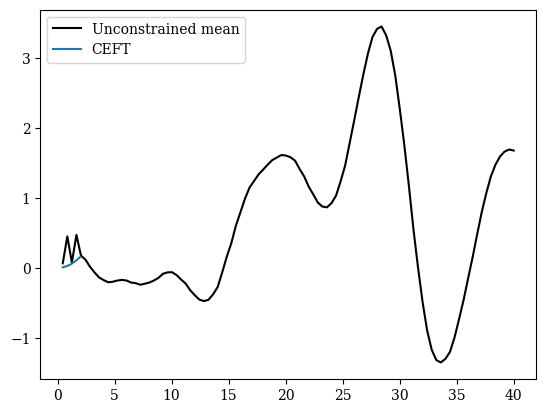

In [18]:
#### MAIN CELL #####

fdgp.fit()
knot_test_fdgp = (fdgp.knots)

cs2_test_fdgp = fdgp.mean_star
sig_fdgp = np.sqrt(np.diag(fdgp.cov_star))

plt.rcParams["font.family"] = "serif"

rng = np.random.default_rng()
y = rng.multivariate_normal(mean=fdgp.mean_star, cov=fdgp.cov_star)
plt.plot(knot_test_fdgp/ns, y, color="black", alpha=1, label='Unconstrained mean')
plt.plot(n_ceft, cs2_ceft, label = "CEFT")
plt.legend()
plt.show()

In [19]:
from scipy.optimize import linprog

n_bound = 25        # number of bounded constraints
n_int   = 24          # number of integral constraints

# Extract rows
lb_bound_rows = fdgp.constraints["M"][:n_bound]
ub_bound_rows = fdgp.constraints["M"][n_bound:2*n_bound]
lb_int_rows   = fdgp.constraints["M"][2*n_bound:2*n_bound + n_int]
ub_int_rows   = fdgp.constraints["M"][2*n_bound + n_int:2*n_bound + 2*n_int]

# Extract RHS
g_lb_bound = fdgp.constraints["g"][:n_bound]
g_ub_bound = fdgp.constraints["g"][n_bound:2*n_bound]
g_lb_int   = fdgp.constraints["g"][2*n_bound:2*n_bound + n_int]
g_ub_int   = fdgp.constraints["g"][2*n_bound + n_int:2*n_bound + 2*n_int]

# Convert to linprog form: A_ub x ≤ b_ub
A_ub = np.vstack([
     -lb_bound_rows,    # Ax ≥ l_bound  →  -Ax ≤ -l_bound
     ub_bound_rows,    # Ax ≤ u_bound  →   Ax ≤ u_bound
     -lb_int_rows,      # Ax ≥ l_int    →  -Ax ≤ -l_int
     ub_int_rows       # Ax ≤ u_int    →   Ax ≤ u_int
])

b_ub = np.hstack([
    g_lb_bound,
    g_ub_bound,
    g_lb_int,
    g_ub_int
])

# Solve feasibility problem
res = linprog(c=np.zeros(fdgp.constraints["M"].shape[1]), A_ub=A_ub, b_ub=b_ub, method="highs")

if res.success:
    print("✅ Feasible constraints")
else:
    print("❌ Infeasible: ", res.message)

zeta_init = res.x


✅ Feasible constraints


In [20]:
# Try solving a *strict feasibility* problem with CVXPY:
x = cp.Variable(fdgp.m)
problem = cp.Problem(cp.Minimize(0),
                     [A_ub @ x + b_ub >= 1e-6])  # slightly inside feasible set
problem.solve(solver=cp.CLARABEL)

if problem.status != "optimal":
    print("⚠️ Feasible region too tight or degenerate.")
else:
    print("✅ Feasibility confirmed")

NameError: name 'cp' is not defined

In [248]:
from scipy.optimize import minimize, LinearConstraint
from scipy.linalg import cholesky, cho_solve


def objective(xi, Gamma_inv, mu):
    return 0.5 * xi.T @ Gamma_inv @ xi - xi.T @ Gamma_inv @ mu
def jac(xi, Gamma_inv, mu):
    return Gamma_inv @ xi - Gamma_inv @ mu

constraint = LinearConstraint(A_ub, lb=-np.inf * np.ones_like(b_ub), ub=b_ub)
m = fdgp.Gamma.shape[0]
L = cholesky(fdgp.cov_star + 1e-8 * np.eye(fdgp.m), lower=True, check_finite=False)
Gamma_inv = cho_solve((L, True), np.eye(fdgp.m), check_finite=False)
fdgp.cov_star_inverse = Gamma_inv

xi0 = np.zeros(m)  # or use the unconstrained mean as init

res = minimize(
    fun=objective,
    x0=xi0,
    args=(Gamma_inv, fdgp.mean_star),
    method='SLSQP',
    jac=jac,
    constraints=[constraint],
    options={"disp": True, "maxiter": 1000}
)

if not res.success:
    raise RuntimeError(f"❌ Failed: {res.message}")
else:
    print("✅ MAP solution found.")
    fdgp.map = res.x

Positive directional derivative for linesearch    (Exit mode 8)
            Current function value: -33324.01837867311
            Iterations: 37
            Function evaluations: 157
            Gradient evaluations: 33


RuntimeError: ❌ Failed: Positive directional derivative for linesearch

ValueError: x, y, and format string must not be None

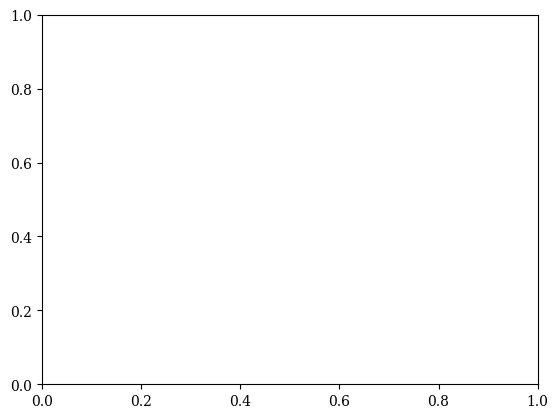

In [215]:
xi_map = fdgp.map

plt.rcParams["font.family"] = "serif"
plt.plot(knot_test_fdgp/ns, xi_map, alpha=1, label='MAP')
plt.plot(n_ceft, cs2_ceft, label = "CEFT")
plt.legend()
plt.show()

In [ ]:
print("Row norms of matrix A:")
print(np.linalg.norm(fdgp.constraints["M"], axis=1))


Row norms of integral matrix A_int:
[1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.         1.         1.         1.         1.
 1.         1.      

In [348]:
for i, (row, rhs) in enumerate(zip(fdgp.constraints["M"], fdgp.constraints["g"])):
    print(f"{i}: min={row.min():.2e}, max={row.max():.2e}, g={rhs:.2e}")


0: min=0.00e+00, max=1.00e+00, g=0.00e+00
1: min=0.00e+00, max=1.00e+00, g=0.00e+00
2: min=0.00e+00, max=1.00e+00, g=0.00e+00
3: min=0.00e+00, max=1.00e+00, g=0.00e+00
4: min=0.00e+00, max=1.00e+00, g=0.00e+00
5: min=0.00e+00, max=1.00e+00, g=0.00e+00
6: min=0.00e+00, max=1.00e+00, g=0.00e+00
7: min=0.00e+00, max=1.00e+00, g=0.00e+00
8: min=0.00e+00, max=1.00e+00, g=0.00e+00
9: min=0.00e+00, max=1.00e+00, g=0.00e+00
10: min=0.00e+00, max=1.00e+00, g=0.00e+00
11: min=0.00e+00, max=1.00e+00, g=0.00e+00
12: min=0.00e+00, max=1.00e+00, g=0.00e+00
13: min=0.00e+00, max=1.00e+00, g=0.00e+00
14: min=0.00e+00, max=1.00e+00, g=0.00e+00
15: min=0.00e+00, max=1.00e+00, g=0.00e+00
16: min=0.00e+00, max=1.00e+00, g=0.00e+00
17: min=0.00e+00, max=1.00e+00, g=0.00e+00
18: min=0.00e+00, max=1.00e+00, g=0.00e+00
19: min=0.00e+00, max=1.00e+00, g=0.00e+00
20: min=0.00e+00, max=1.00e+00, g=0.00e+00
21: min=0.00e+00, max=1.00e+00, g=0.00e+00
22: min=0.00e+00, max=1.00e+00, g=0.00e+00
23: min=0.00e+00, max

In [666]:
np.linalg.matrix_rank(Lam_int)

24

In [667]:
Lam_int.shape

(24, 100)

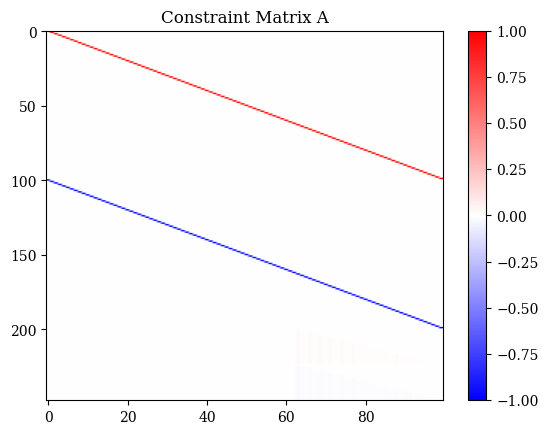

In [668]:
plt.imshow(fdgp.constraints["M"], aspect='auto', cmap='bwr')
plt.colorbar()
plt.title("Constraint Matrix A")
plt.show()


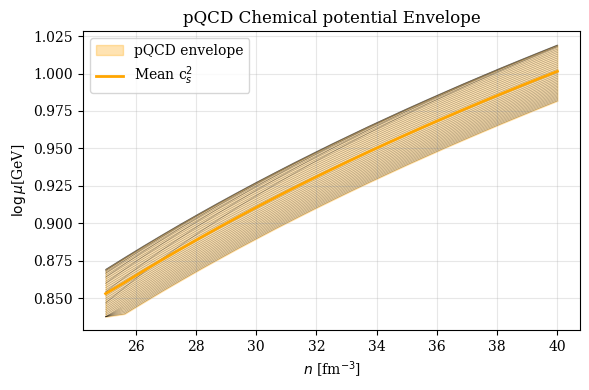

In [409]:
plt.figure(figsize=(6, 4))
for mu in mu_family:
    plt.plot(n_pqcd_grid/ns, np.log(mu/m0), lw=0.5, alpha=0.3, color='black')

plt.fill_between(n_pqcd_grid/ns, np.log(mu_min/m0), np.log(mu_max/m0), color='orange', alpha=0.3, label='pQCD envelope')
plt.plot(n_pqcd_grid/ns, np.log(mu_mean/m0), color='orange', lw=2, label='Mean c$_s^2$')

#plt.plot(n_pqcd_grid/ns, np.log((n_pqcd_grid/n_ini)/ns), label="Maximal EOS")

plt.xlabel(r'$n$ [fm$^{-3}$]')
plt.ylabel(r'$\log\mu$[GeV]')
plt.title('pQCD Chemical potential Envelope')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()


In [609]:
row_norms = np.linalg.norm(Lam_int, axis=1)

# Choose a numerical threshold: anything below this is "almost zero"
threshold = 1e-3

# Find the indices of nearly-zero rows
near_zero_rows = np.where(row_norms < threshold)[0]

# Check the corresponding lower and upper bounds
tight_rows = []
for i in near_zero_rows:
    if abs(u_int[i] - l_int[i]) > 1e-5:  # Arbitrary "tight" threshold
        tight_rows.append(i)
        print(f"Row {i} has norm={row_norms[i]:.2e}, l={l_int[i]:.3f}, u={u_int[i]:.3f}")

print(f"Total suspicious rows: {len(tight_rows)}")


Total suspicious rows: 0


In [411]:
import cvxpy as cp

x = cp.Variable(fdgp.m)
constraints = [M @ x + g >= 0]
obj = cp.Minimize(0)  # Dummy objective

problem = cp.Problem(obj, constraints)
problem.solve(solver=cp.PIQP, verbose=True)

print("Status:", problem.status)


ValueError: Incompatible dimensions (998, 500) (200, 1)

In [327]:
x = cp.Variable(fdgp.m)
M = fdgp.constraints["M"]
g = fdgp.constraints["g"]


constraints = [M @ x + g >= 0]
problem = cp.Problem(cp.Minimize(0), constraints)
problem.solve(solver=cp.SCIPY)
print(problem.status)


infeasible


In [21]:
#### MAIN CELL #####

import cvxpy as cp
from scipy.linalg import cholesky, cho_solve
import proxsuite
import piqp

# Cholesky for efficient inverse
L = cholesky(fdgp.cov_star + 1e-8 * np.eye(fdgp.m), lower=True, check_finite=False)
Gamma_inv = cho_solve((L, True), np.eye(fdgp.m), check_finite=False)
r = Gamma_inv @ fdgp.mean_star

Q = Gamma_inv
c = -r
M = fdgp.constraints["M"]
g = fdgp.constraints["g"]



fdgp.cov_star_inverse = Gamma_inv

In [329]:
import numpy as np
from numpy.linalg import matrix_rank

print("A shape:", Lam_int.shape)
print("A rank:", np.linalg.matrix_rank(Lam_int))


A shape: (24, 200)
A rank: 24


In [330]:
eps = 1  # or try 1e-1 if needed


z = cp.Variable(fdgp.m)

constraints = [
    cs2_constraint["M"] @ z + cs2_constraint["g"] >= 0,
    l_int -eps <= Lam_int @ z,
    Lam_int @ z <= u_int +eps
]

prob = cp.Problem(cp.Minimize(0), constraints)
prob.solve(solver="CLARABEL")

print("Status:", prob.status)


Status: optimal


In [301]:
# Project avg_int into envelope-only space
z = cp.Variable(fdgp.m)
avg_int = 0.5 * (l_int + u_int)

constraints = [cs2_constraint["M"] @ z + cs2_constraint["g"] >= 0]

objective = cp.sum_squares(Lam_int @ z - avg_int)
problem = cp.Problem(cp.Minimize(objective), constraints)
problem.solve(solver="OSQP")

z_proj = z.value
int_proj = Lam_int @ z_proj

print("Residual:", np.linalg.norm(int_proj - avg_int))
print("Min deviation from band:", np.min(int_proj - u_int), np.max(l_int - int_proj))


Residual: 4.091122119454249
Min deviation from band: -0.8667408838525237 0.8291148795505826


Text(0.5, 1.0, 'Best fit under envelope vs. required integral')

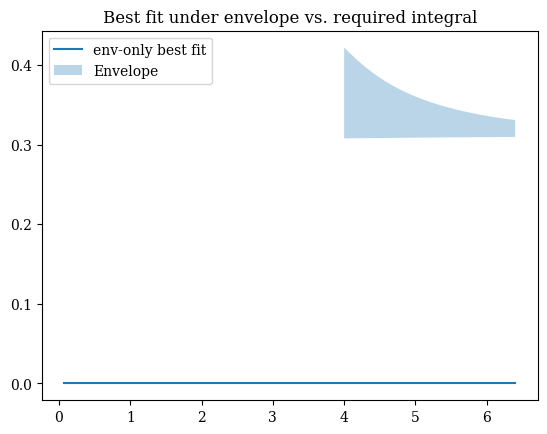

In [309]:
f_proj = fdgp.Phi_matrix @ z_proj
plt.plot(knot_test_fdgp, f_proj, label="env-only best fit")
plt.fill_between(n_grid, cs2_min, cs2_max, alpha=0.3, label="Envelope")
plt.legend()
plt.title("Best fit under envelope vs. required integral")


In [22]:
#### MAIN CELL #####

x = cp.Variable(fdgp.m)
objective = 0.5 * cp.quad_form(x, cp.psd_wrap(Q)) + c @ x
constraints = [M @ x + g >= 0]
#constraints = [Lam_int @ x >= l_int, Lam_int @ x <= u_int]
problem = cp.Problem(cp.Minimize(objective), constraints)

# Solve the QP
problem.solve(solver=cp.OSQP, verbose=True,
    eps_abs=1e-2,
    eps_rel=1e-2,
    max_iter=50000)

# Check status
if problem.status not in ["optimal", "optimal_inaccurate"]:
    raise RuntimeError(f"CVXPY failed: {problem.status}")

# Store the MAP
fdgp.map = x.value

(CVXPY) Jul 07 09:32:45 PM: Your problem has 100 variables, 248 constraints, and 0 parameters.
(CVXPY) Jul 07 09:32:45 PM: It is compliant with the following grammars: DCP, DQCP
(CVXPY) Jul 07 09:32:45 PM: (If you need to solve this problem multiple times, but with different data, consider using parameters.)
(CVXPY) Jul 07 09:32:45 PM: CVXPY will first compile your problem; then, it will invoke a numerical solver to obtain a solution.
(CVXPY) Jul 07 09:32:45 PM: Your problem is compiled with the CPP canonicalization backend.
(CVXPY) Jul 07 09:32:45 PM: Compiling problem (target solver=OSQP).
(CVXPY) Jul 07 09:32:45 PM: Reduction chain: CvxAttr2Constr -> Qp2SymbolicQp -> QpMatrixStuffing -> OSQP
(CVXPY) Jul 07 09:32:45 PM: Applying reduction CvxAttr2Constr
(CVXPY) Jul 07 09:32:45 PM: Applying reduction Qp2SymbolicQp
(CVXPY) Jul 07 09:32:45 PM: Applying reduction QpMatrixStuffing
(CVXPY) Jul 07 09:32:45 PM: Applying reduction OSQP
(CVXPY) Jul 07 09:32:45 PM: Finished problem compilation 

                                     CVXPY                                     
                                     v1.6.6                                    
-------------------------------------------------------------------------------
                                  Compilation                                  
-------------------------------------------------------------------------------
-------------------------------------------------------------------------------
                                Numerical solver                               
-------------------------------------------------------------------------------
-----------------------------------------------------------------
           OSQP v1.0.0  -  Operator Splitting QP Solver
              (c) The OSQP Developer Team
-----------------------------------------------------------------
problem:  variables n = 100, constraints m = 248
          nnz(P) + nnz(A) = 6282
settings: algebra = Built-in,
          OSQPInt 

RuntimeError: CVXPY failed: infeasible

In [169]:
avg = 0.5 * (l_int - 0 + u_int + 0)  # midpoint of relaxed bounds
x = cp.Variable(fdgp.m)
prob = cp.Problem(cp.Minimize(cp.sum_squares(Lam_int @ x - avg)))
prob.solve(solver="OSQP")
z_proj = Lam_int @ x.value
resid = np.linalg.norm(z_proj - avg)
print("Not relaxed Projection residual:", resid)

within_box = np.all(z_proj >= l_int - 0) and np.all(z_proj <= u_int + 0)
print("Projection lies within unrelaxed box:", within_box)


Not relaxed Projection residual: 1.1644117316690922e-15
Projection lies within unrelaxed box: True


In [171]:
x = cp.Variable(fdgp.m)
constraints = [Lam_int @ x >= l_int, Lam_int @ x <= u_int]
prob = cp.Problem(cp.Minimize(0), constraints)
prob.solve(solver="OSQP")
print("status:", prob.status)


Polishing not needed - no active set detected at optimal point
status: optimal


In [173]:
avg_int = (l_int+u_int)/2
x = cp.Variable(fdgp.m)
residual = Lam_int @ x - avg_int
objective = 0.5 * cp.sum_squares(x) + 1e3 * cp.sum_squares(residual)
problem = cp.Problem(cp.Minimize(objective))
problem.solve(solver="OSQP")


616.7003914496105

In [177]:
x = cp.Variable(fdgp.m)
objective = 0.5 * cp.quad_form(x, cp.psd_wrap(Q)) + c @ x
constraints = [Lam_int @ x >= l_int, Lam_int @ x <= u_int]
problem = cp.Problem(cp.Minimize(objective), constraints)
problem.solve(solver="PIQP", eps_abs=1e-6, eps_rel=1e-6, max_iter=50000)


-5743.623327720799

In [178]:
ζ_map = x.value
integral_estimate = Lam_int @ ζ_map
print("Residuals vs bounds:")
print("min residual:", np.min(integral_estimate - l_int))
print("max residual:", np.max(integral_estimate - u_int))


Residuals vs bounds:
min residual: 0.17464720666359784
max residual: -1.7512649602659014


In [ ]:
## turning to equality constraint ##

z_cand = np.zeros(fdgp.m)          # start at prior mean or 0
# Solve   minimize ||Lam_int z - avg||²    subject to envelope + box
avg_int = 0.5*(l_int + u_int)
z = cp.Variable(fdgp.m)
prob = cp.Problem(cp.Minimize(cp.sum_squares(Lam_int @ z - avg_int)),
                  [cs2_constraint["M"] @ z + cs2_constraint["g"] >= 0,
                   non_pqcd_bounds["M"] @ z + non_pqcd_bounds["g"] >= 0])
prob.solve(solver="OSQP")
print("residual:", np.linalg.norm(Lam_int @ z.value - avg_int))


residual: 4.096089115048582


In [65]:
viol = M @ fdgp.mean_star + g
print("Max violation:", np.max(viol))
print("Min violation:", np.min(viol))
print("Any violated?:", np.any(viol < -1e-6))


Max violation: 0.8375059699963834
Min violation: -0.8692358999752363
Any violated?: True


In [277]:
cond_Q = np.linalg.cond(Q)

print(f"Condition number of Q: {cond_Q:.2e}")


Condition number of Q: 1.49e+09


In [278]:
eigs = np.linalg.eigvalsh(Q)  # For symmetric Q
print(f"Min eigenvalue: {eigs.min():.2e}")
print(f"Max eigenvalue: {eigs.max():.2e}")
print(f"Condition number: {eigs.max() / eigs.min():.2e}")


Min eigenvalue: 5.95e-02
Max eigenvalue: 8.84e+07
Condition number: 1.49e+09


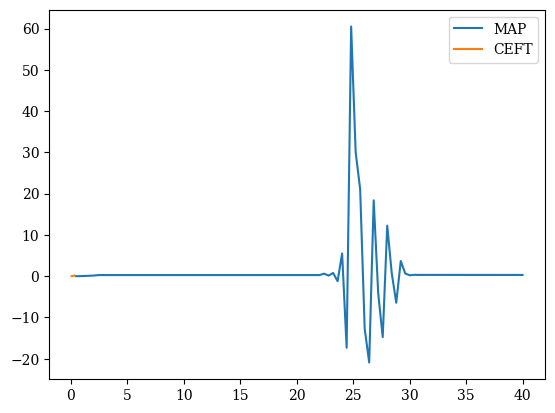

NameError: name 'e_ini' is not defined

In [230]:
#### MAIN CELL ####
#xi_map = fdgp.compute_MAP()
xi_map = fdgp.map

plt.rcParams["font.family"] = "serif"
plt.plot(knot_test_fdgp/ns, xi_map, alpha=1, label='MAP')
plt.plot(n_ceft, cs2_ceft, label = "CEFT")
plt.legend()
plt.show()


EOS = eos.EosProperties(knot_test_fdgp/ns, phi=None, epsi_0 = e_ini, p_0 = p_ini, mu_0=mu_ini,  cs2=xi_map)
eos_prop_results = EOS.get_all()



plt.plot(knot_test_fdgp/ns, eos_prop_results["mu"].flatten(), label = "FDGP prediction")
plt.fill_between(n_pqcd_grid/ns, mu_min, mu_max, color='orange', alpha=0.3, label='pQCD envelope')
plt.plot(n_pqcd_int/0.16, mu_pqcd, "--", label = "integral observation")



plt.title("Chemical potential")
plt.xlabel('n [n_sat]')
plt.ylabel(r'$\mu$[MeV]')
plt.legend()

#plt.xlim(0,5)
#plt.ylim(900,1300)

plt.show()

plt.plot(eos_prop_results["epsilon"].flatten(), eos_prop_results["pressure"].flatten())
plt.xlabel(r"edens [Mev/fm^3]")
plt.ylabel(r'pressure [Mev/fm^3]')
plt.title("pressure vs edens")
plt.show()


In [647]:
violations = fdgp.constraints["M"] @ fdgp.map + fdgp.constraints["g"]

print("Minimum slack:", violations.min())
print("Number of violated constraints:", np.sum(violations < 0))


Minimum slack: -1.9954629859597617e-07
Number of violated constraints: 31


In [417]:
import cvxpy as cp
import numpy as np

M = fdgp.constraints["M"]
g = fdgp.constraints["g"]
m = M.shape[1]  # Number of variables

x = cp.Variable(m)
r = cp.Variable()  # radius of ball

# Each constraint must satisfy: M[i] @ x + g[i] >= ||M[i]|| * r
constraints = [M[i] @ x + g[i] >= cp.norm(M[i]) * r for i in range(M.shape[0])]
constraints += [r >= 0]

problem = cp.Problem(cp.Maximize(r), constraints)
problem.solve(solver=cp.SCS)

print(f"Chebyshev center radius: {r.value:.4e}")


Chebyshev center radius: 2.3873e-01


In [238]:
xi = fdgp.mean_star  # or fdgp.map

violations = fdgp.constraints["M"] @ xi + fdgp.constraints["g"]
min_slack = np.min(violations)
num_violated = np.sum(violations < 0)

print(f"Minimum slack: {min_slack}")
print(f"Violated constraints: {num_violated}")


Minimum slack: -0.8293009868586492
Violated constraints: 24


In [206]:
for i in range(10):
    xi_try = xi + 0.01 * np.random.randn(fdgp.m)
    violations = M @ xi_try + g
    print(f"Trial {i}: min slack = {np.min(violations)}")


Trial 0: min slack = 0.1747444466322672
Trial 1: min slack = 0.1742818288537953
Trial 2: min slack = 0.1748247881225645
Trial 3: min slack = 0.1744562633978937
Trial 4: min slack = 0.1747471406099751
Trial 5: min slack = 0.17429045126763934
Trial 6: min slack = 0.17488318998927557
Trial 7: min slack = 0.1745824335487256
Trial 8: min slack = 0.17481053782290085
Trial 9: min slack = 0.17471868684802247


In [207]:
xi = fdgp.map
slack = M @ xi + g
tight = np.abs(slack) < 1e-6
print(f"{np.sum(tight)} of {len(slack)} constraints are tight.")


0 of 48 constraints are tight.


In [208]:
import numpy as np

def hit_and_run_sampler(A, b, x0, n_samples=1000, burn_in=100, thinning=1, seed=None):
    """
    Basic Hit-and-Run sampler from Ax <= b.
    A: (m, d) constraint matrix
    b: (m,) constraint vector
    x0: initial point inside the feasible region
    Returns: (n_samples, d) samples
    """
    np.random.seed(seed)
    d = x0.shape[0]
    x = x0.copy()
    samples = []

    def is_feasible(x):
        return np.all(A @ x <= b + 1e-10)

    if not is_feasible(x):
        raise ValueError("Initial point is not feasible")

    for i in range(n_samples * thinning + burn_in):
        # Random direction (unit vector on sphere)
        u = np.random.randn(d)
        u /= np.linalg.norm(u)

        # Find max step size α such that A(x + αu) ≤ b
        Au = A @ u
        with np.errstate(divide='ignore', invalid='ignore'):
            t = (b - A @ x) / Au
        t[np.isnan(t)] = np.inf
        t[Au == 0] = np.inf  # Direction doesn't affect that constraint

        # Split bounds to find [min_alpha, max_alpha]
        t_pos = t[Au > 0]
        t_neg = t[Au < 0]
        alpha_max = np.min(t_pos) if t_pos.size > 0 else np.inf
        alpha_min = np.max(t_neg) if t_neg.size > 0 else -np.inf

        if alpha_min >= alpha_max:
            raise RuntimeError("Hit-and-Run: No valid step found.")

        alpha = np.random.uniform(alpha_min, alpha_max)
        x = x + alpha * u

        if i >= burn_in and (i - burn_in) % thinning == 0:
            samples.append(x.copy())

    return np.array(samples)


In [209]:
A = -fdgp.constraints["M"]  # convert to Ax <= b
b = fdgp.constraints["g"]
x0 = fdgp.map  # Must be a feasible point

samples = hit_and_run_sampler(A, b, x0, n_samples=1000, burn_in=10000, thinning=1, seed=42)


In [434]:
samples = fdgp.sample_posterior(1,return_trace=False, burn_in=1)

ValueError: Sampling error: ShapeError/OutOfBounds: out of bounds indexing

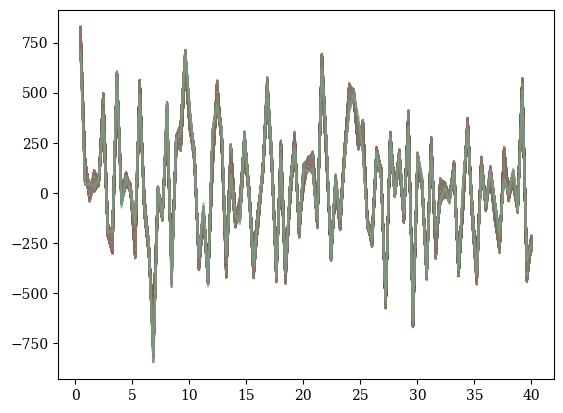

In [210]:
for i in samples:
    plt.plot(knot_test_fdgp/ns, i, alpha=0.3)


In [435]:
cs2_constrained = np.asarray([
    [
        sum(samples[i][j] * fdgp._phi_j(j, x) for j in range(fdgp.m))
        for x in fdgp.x_test
    ]
    for i in range(main_sample.shape[0])
])

x_test_fdgp = (fdgp.x_test * (fdgp.x_max - fdgp.x_min)) + fdgp.x_min
plt.plot(knot_test_fdgp, constr_cs2, label='FDGP MAP')
for i in range(0, main_sample.shape[0]):
    plt.plot(x_test_fdgp, cs2_constrained[i], alpha = 0.5)
#plt.plot(n, cs2, 'r.', markersize=5, label='Observations')
plt.xlabel('n [n_sat]')
plt.ylabel(r'$c_s^2$(n)')
plt.title("Constrained FDGP")
plt.legend()
plt.show()

NameError: name 'main_sample' is not defined

# tmvn sampler

In [23]:
def softplus(x):
    return np.maximum(x, 0) + np.log1p(np.exp(-np.abs(x)))
    #return np.log1p(np.exp(x))

def log_likelihood_approx(zeta, A, b, eta):
    """
    Approximate log likelihood for linear constraints A zeta + b >= 0
    using a scaled sigmoid function.

    zeta: (d,) current sample
    A: (m, d) constraint matrix
    b: (m,) constraint offset
    eta: approximation strength

    Returns: scalar log likelihood
    """
    logits = A @ zeta + b
    return -np.sum(softplus(-eta * logits))

In [24]:
def log_likelihood_full(zeta, X, y, A, b, eta):
    resid = y - X @ zeta
    sigma = 1e-3
    data_term = -0.5 / sigma**2 * np.dot(resid, resid)
    constraint_term = -np.sum(np.log1p(np.exp(-eta * (A @ zeta + b))))
    return data_term + constraint_term

In [25]:
def sample_prior(cov):
    """
    Sample from N(0, cov)
    """
    return np.random.multivariate_normal(mean=np.zeros(cov.shape[0]), cov=cov)


In [27]:
def project_onto_constraints(A, b, z):
    """
    Project vector z onto the feasible set defined by A x + b >= 0
    using CVXPY with CLARABEL solver.
    Solves: min_x 0.5 * ||x - z||² subject to A x + b >= 0
    """
    d = z.shape[0]
    x = cp.Variable(d)

    objective = cp.Minimize(0.5 * cp.sum_squares(x - z))
    constraints = [A @ x + b >= 0]
    problem = cp.Problem(objective, constraints)
    
    problem.solve(solver=cp.CLARABEL, verbose=False)

    if problem.status not in ["optimal", "optimal_inaccurate"]:
        raise RuntimeError(f"Projection failed: {problem.status}")
    
    return x.value


In [26]:
def elliptical_slice_sampling(f, cov, A, b, eta, log_likelihood_fn, max_attempts=100000):
    nu = sample_prior(cov)
    log_y = log_likelihood_fn(f, A, b, eta) + np.log(np.random.uniform())

    theta = np.random.uniform(0, 2 * np.pi)
    theta_min = theta - 2 * np.pi
    theta_max = theta

    for _ in range(max_attempts):
        f_prime = f * np.cos(theta) + nu * np.sin(theta)
        ll = log_likelihood_fn(f_prime, A, b, eta)

        if ll > log_y:
            print(f"θ: {theta:.2f}, log_y: {log_y:.2f}, log_ll: {ll:.2f}, min_constraint: {np.min(A @ f_prime + b):.4f}")

            violation = A @ f_prime + b
            if np.all(violation >= 0):
                return f_prime
            elif np.min(violation) > -1e-6:
                # Mild violation → likely due to approximation → project
                try:
                    projected = project_onto_constraints(A, b, f_prime)
                    return projected
                except RuntimeError:
                    print("⚠️ Projection failed, even for feasible point")
                    continue

            # Else: do not accept — continue slicing
        # Not accepted: shrink bracket
        if theta < 0:
            theta_min = theta
        else:
            theta_max = theta
        theta = np.random.uniform(theta_min, theta_max)

    raise RuntimeError("ESS failed to find valid sample after max_attempts.")


In [28]:
def sample_tmvn_ess(mu, cov, A, b, X, y, n_samples, eta_init=20.0, update_eta=False):
    d = mu.shape[0]
    zeta = mu.copy()
    samples = []
    eta = eta_init
    count = 0

    while len(samples) < n_samples:
        zeta_centered = zeta - mu
        zeta_centered = elliptical_slice_sampling(
            f=zeta_centered,
            cov=cov,
            A=A,
            b=b,
            eta=eta,
            log_likelihood_fn=lambda z, *_: log_likelihood_full(z + mu, X, y, A, b, eta)
        )
        zeta = zeta_centered + mu
        if np.all(A @ zeta + b >= 0):
            samples.append(zeta.copy())

        if update_eta:
            eta *= 1.01

        if count > n_samples + 10:
            raise ValueError("Max iterations reached")
        count += 1

    return np.stack(samples)

In [29]:
def sample_posterior(self, init, n_samples, eta=20, burn_in=1000, update_eta=True):
    mu = init
    cov = np.linalg.inv(self.cov_star_inverse)
    A = self.constraints["M"]
    b = self.constraints["g"]
    X = self.Phi_matrix  # assume you store design matrix in self.X
    y = self.y_train  # assume targets are in self.y

    samples = sample_tmvn_ess(mu, cov, A, b, X, y, n_samples + burn_in, eta_init=eta, update_eta=update_eta)
    return samples[burn_in:]

# sample:

In [30]:
samples = sample_posterior(fdgp, fdgp.mean_star, 1, eta = 20, burn_in=1, update_eta=True)

θ: 0.36, log_y: -10269421.00, log_ll: -10254364.98, min_constraint: -1.2187
θ: 0.10, log_y: -10269421.00, log_ll: -10265136.18, min_constraint: -1.0397
θ: 0.06, log_y: -10269421.00, log_ll: -10266920.66, min_constraint: -1.0156
θ: 0.00, log_y: -10269421.00, log_ll: -10269253.22, min_constraint: -0.9840
θ: 0.00, log_y: -10269421.00, log_ll: -10269416.77, min_constraint: -0.9818
θ: 0.00, log_y: -10269421.00, log_ll: -10269418.29, min_constraint: -0.9818
θ: 0.00, log_y: -10269421.00, log_ll: -10269419.92, min_constraint: -0.9818
θ: -0.00, log_y: -10269421.00, log_ll: -10269420.81, min_constraint: -0.9818
θ: 0.00, log_y: -10269421.00, log_ll: -10269420.04, min_constraint: -0.9818
θ: 0.00, log_y: -10269421.00, log_ll: -10269420.64, min_constraint: -0.9818
θ: 0.00, log_y: -10269421.00, log_ll: -10269420.64, min_constraint: -0.9818
θ: -0.00, log_y: -10269421.00, log_ll: -10269420.79, min_constraint: -0.9818
θ: -0.00, log_y: -10269421.00, log_ll: -10269420.75, min_constraint: -0.9818
θ: -0.00,

RuntimeError: ESS failed to find valid sample after max_attempts.

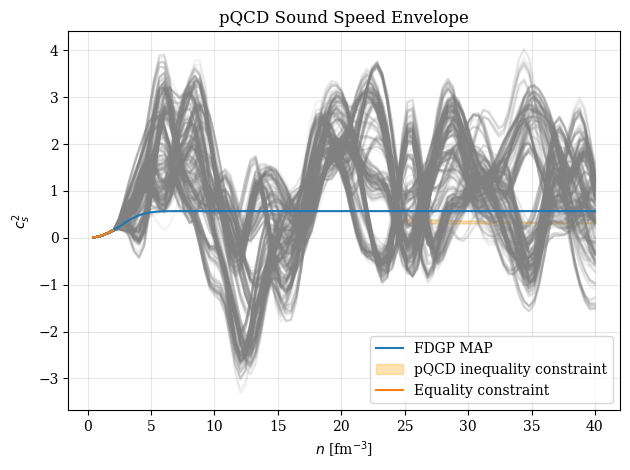

In [221]:
for i in samples:
    plt.plot(knot_test_fdgp/ns, i ,alpha=0.1, color='gray')

#plt.plot(knot_test_fdgp/ns, y, color="black", alpha=1, label='Unconstrained mean')
plt.plot(knot_test_fdgp/ns, fdgp.map, label='FDGP MAP')
plt.fill_between(n_pqcd_grid/ns, cs2_min, cs2_max, color='orange', alpha=0.3, label='pQCD inequality constraint')
plt.plot(n_ceft, cs2_ceft, label='Equality constraint')
plt.xlabel(r'$n$ [fm$^{-3}$]')
plt.ylabel(r'$c_s^2$')
plt.title('pQCD Sound Speed Envelope')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()